In [1]:
import numpy as np
import scanpy as sc
import pandas as pd
import anndata as ad
import matplotlib.pyplot as plt

In [2]:
sc.logging.print_header()

scanpy==1.7.1 anndata==0.7.5 umap==0.5.1 numpy==1.19.2 scipy==1.5.2 pandas==1.1.3 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.9.0


In [6]:
adata = sc.read('C:/Users/aamw4/home/aamw4/mixl_chim_atlas.h5')
#adata = sc.read('/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/data/mixl_chim_atlas.h5')

In [7]:
adata_chim = adata[adata.obs_names.str.startswith('chim'),:].copy()

In [276]:
adata_atlas = adata[adata.obs_names.str.startswith('atlas'),:].copy()

In [277]:
adata_atlas

AnnData object with n_obs × n_vars = 116312 × 31217
    obs: 'sample', 'stage', 'barcode', 'sequencing.batch', 'stripped', 'doublet', 'theiler', 'doub.density', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'weight', 'stage.mapped', 'celltype.mapped', 'closest.cell', 'sizeFactor', 'tdTom'
    obsm: 'X_pca'
    layers: 'logcounts'

In [15]:
df = pd.read_csv('C:/Users/aamw4/home/aamw4/ensembl_gene_table_81.txt', header=0, sep='\t', index_col=0)
df

list_names = [name for name in list(df.index) if name in adata_mixl.var_names]

adata_mixl =  adata_mixl[:,list_names].copy()

adata_mixl.var_names = list(df.loc[list_names]['Associated Gene Name'])

adata_mixl.var_names_make_unique()

adata_mixl.var_names

Index(['mt-Cytb', 'mt-Nd6', 'mt-Nd5', 'mt-Nd4', 'mt-Nd4l', 'mt-Nd3', 'mt-Co3',
       'mt-Atp6', 'mt-Atp8', 'mt-Co2',
       ...
       'Impact', 'Dsg3', 'Fam13b', 'Rprd1a', 'Taf4b', 'Zfp521', 'Hrh4', 'Dsc1',
       'Psma8', '2700062C07Rik'],
      dtype='object', length=27917)

In [210]:
lista_colori = ['#532C8A',#all
 '#c19f70',#aps
 '#f9decf',#bp1
 '#c9a997',#bp2
 '#B51D8D',#cardiom
 '#3F84AA',#caudal mes
 '#9e6762',#caudal epi
 '#354E23',#caud neur
 '#F397C0',#"Def. endoderm"
'#ff891c',#endot
# '#635547',#epiblast
 '#C72228',#ery1
 '#f79083',#ery2
'#EF4E22',#ery3
 '#989898',#ExE ectoderm
 '#7F6874',#ExE endoderm
 '#8870ad',#ExE mesoderm
 '#647a4f',#brain
 '#EF5A9D',#Gut
 '#FBBE92',#Haematoendothelial progenitors
 '#139992',#Intermediate mesoderm
 '#cc7818',#'Mesenchyme'
 '#DFCDE4',#Mixed mesoderm
 '#8EC792',#nmp
# '#C594BF',#nasc meso
 '#C3C388',#neural crest
 '#0F4A9C',#Notochord
 '#FACB12',#pgc
 '#8DB5CE',#Parietal meso
 '#1A1A1A', # Parietal endoderm
 '#C9EBFB',# Pharyngeal mesoderm
# '#DABE99',#prim str
 '#65A83E',# Rostral neurectoderm
 '#005579',#somitic mesoderm
 '#CDE088', #Spinal cord
 '#f7f79e', # surf ecto
 '#F6BFCB'] #visceral ed
# '#F5F5F5'] grey?
adata_chim.uns['celltype.mapped_colors'] = lista_colori
adata_mixl.uns['celltype.mapped_colors'] = lista_colori
adata.uns['celltype_colors'] = lista_colori
adata_atlas.uns['celltype_colors'] = lista_colori

In [18]:
np.unique(adata_mixl.obs['celltype.mapped'])

array(['Allantois', 'Blood progenitors 1', 'Blood progenitors 2',
       'Cardiomyocytes', 'Caudal Mesoderm', 'Caudal epiblast',
       'Def. endoderm', 'Endothelium', 'Erythroid1', 'Erythroid2',
       'Erythroid3', 'ExE ectoderm', 'ExE endoderm', 'ExE mesoderm',
       'Forebrain/Midbrain/Hindbrain', 'Gut',
       'Haematoendothelial progenitors', 'Intermediate mesoderm',
       'Mesenchyme', 'Mixed mesoderm', 'NMP', 'Neural crest', 'Notochord',
       'PGC', 'Paraxial mesoderm', 'Pharyngeal mesoderm',
       'Rostral neurectoderm', 'Somitic mesoderm', 'Spinal cord',
       'Surface ectoderm', 'Visceral endoderm'], dtype=object)

In [19]:
lista_colori = ['#532C8A',#all
 '#f9decf',#bp1
 '#c9a997',#bp2
 '#B51D8D',#cardiom
 '#3F84AA',#caudal mes
 '#9e6762',#caudal epi
 
 '#F397C0',#"Def. endoderm"
'#ff891c',#endot

 '#C72228',#ery1
 '#f79083',#ery2
'#EF4E22',#ery3
 '#989898',#ExE ectoderm
 '#7F6874',#ExE endoderm
 '#8870ad',#ExE mesoderm
 '#647a4f',#brain
 '#EF5A9D',#Gut
 '#FBBE92',#Haematoendothelial progenitors
 '#139992',#Intermediate mesoderm
 '#cc7818',#'Mesenchyme'
 '#DFCDE4',#Mixed mesoderm
 '#8EC792',#nmp

 '#C3C388',#neural crest
 '#0F4A9C',#Notochord
 '#FACB12',#pgc

 '#1A1A1A', # Parietal endoderm
 '#C9EBFB',# Pharyngeal mesoderm

 '#65A83E',# Rostral neurectoderm
 '#005579',#somitic mesoderm
 '#CDE088', #Spinal cord
 '#f7f79e', # surf ecto
 '#F6BFCB'] #visceral ed
# '#F5F5F5'] grey?

adata_mixl.uns['celltype.mapped_colors'] = lista_colori

In [8]:
adata_chim.obs['comb'] = adata_chim.obs['celltype.mapped'].astype('str') + '_' + adata_chim.obs.stage.astype('str')

In [21]:
adata_atlas.obs['comb'] = adata_atlas.obs['celltype'].astype('str') + '_' + adata_atlas.obs.stage.astype('str')

In [22]:
df = adata_atlas.obs.groupby('comb').count()

In [23]:
df

,sample,stage,barcode,sequencing.batch,stripped,doublet,theiler,doub.density,cluster,cluster.sub,...,endo_gutX,endo_gutY,endo_gutDPT,endo_gutCluster,weight,stage.mapped,celltype.mapped,closest.cell,sizeFactor,tdTom
comb,,,,,,,,,,,,,,,,,,,,,
Allantois_E7.5,12,12,12,12,12,12,12,12,12,12,...,0,0,0,12,12,12,12,12,12,12
Allantois_E7.75,238,238,238,238,238,238,238,238,238,238,...,0,0,0,238,238,238,238,238,238,238
Allantois_E8.0,418,418,418,418,418,418,418,418,418,418,...,0,0,0,418,418,418,418,418,418,418
Allantois_E8.25,526,526,526,526,526,526,526,526,526,526,...,0,0,0,526,526,526,526,526,526,526
Allantois_E8.5,618,618,618,618,618,618,618,618,618,618,...,0,0,0,618,618,618,618,618,618,618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Visceral endoderm_E7.75,148,148,148,148,148,148,148,148,148,148,...,0,0,0,148,148,148,148,148,148,148
Visceral endoderm_E8.0,59,59,59,59,59,59,59,59,59,59,...,0,0,0,59,59,59,59,59,59,59
Visceral endoderm_E8.25,22,22,22,22,22,22,22,22,22,22,...,0,0,0,22,22,22,22,22,22,22


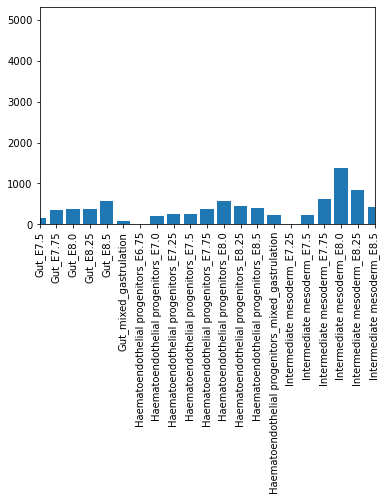

In [24]:
plt.bar(range(254),np.array(list(df['sample'])));
plt.xticks(range(254),df.index, rotation=90);
plt.xlim([120,140])
plt.savefig("haematoendothelial_progenitors_stage_atlas.png")

In [13]:
df2 = adata_chim.obs.groupby('comb').count()

In [14]:
df2

,sample,stage,barcode,sequencing.batch,stripped,doublet,theiler,doub.density,cluster,cluster.sub,...,endo_gutX,endo_gutY,endo_gutDPT,endo_gutCluster,weight,stage.mapped,celltype.mapped,closest.cell,sizeFactor,tdTom
comb,,,,,,,,,,,,,,,,,,,,,
Allantois_E8.5,2881,2881,2881,2881,2881,2881,2881,0,0,0,...,0,0,0,2881,2881,2881,2881,2881,2881,2881
Anterior Primitive Streak_E8.5,1,1,1,1,1,1,1,0,0,0,...,0,0,0,1,1,1,1,1,1,1
Blood progenitors 1_E8.5,127,127,127,127,127,127,127,0,0,0,...,0,0,0,127,127,127,127,127,127,127
Blood progenitors 2_E8.5,460,460,460,460,460,460,460,0,0,0,...,0,0,0,460,460,460,460,460,460,460
Cardiomyocytes_E8.5,1225,1225,1225,1225,1225,1225,1225,0,0,0,...,0,0,0,1225,1225,1225,1225,1225,1225,1225
Caudal Mesoderm_E8.5,153,153,153,153,153,153,153,0,0,0,...,0,0,0,153,153,153,153,153,153,153
Caudal epiblast_E8.5,7,7,7,7,7,7,7,0,0,0,...,0,0,0,7,7,7,7,7,7,7
Caudal neurectoderm_E8.5,1,1,1,1,1,1,1,0,0,0,...,0,0,0,1,1,1,1,1,1,1
Def. endoderm_E8.5,444,444,444,444,444,444,444,0,0,0,...,0,0,0,444,444,444,444,444,444,444


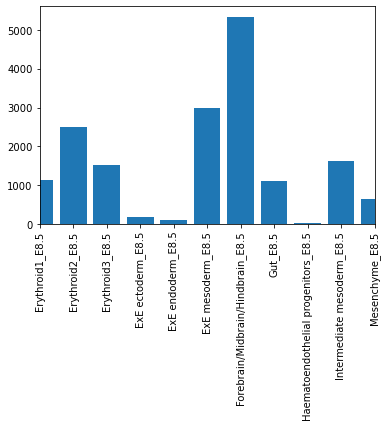

In [25]:
plt.bar(range(34),np.array(list(df2['sample'])));
plt.xticks(range(34),df2.index, rotation=90);
plt.xlim([10,20])
plt.savefig("haematoendothelial_progenitors_stage_chim.png")

In [34]:
sc.pp.neighbors(adata_chim, n_neighbors=30) #or chim

In [175]:
sc.tl.umap(adata_chim)

... storing 'comb' as categorical


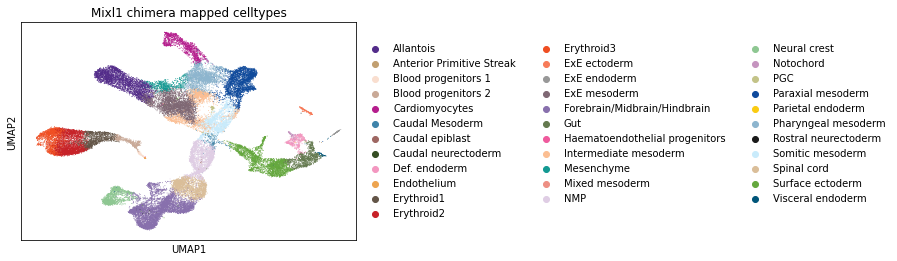

In [38]:
sc.pl.umap(adata_chim, color = 'celltype.mapped', save='Mixl1 chim mapped celltypes', title='Mixl1 chimera mapped celltypes')

In [176]:
sc.tl.diffmap(adata_atlas)
sc.pp.neighbors(adata_atlas, n_neighbors=10, use_rep='X_diffmap')

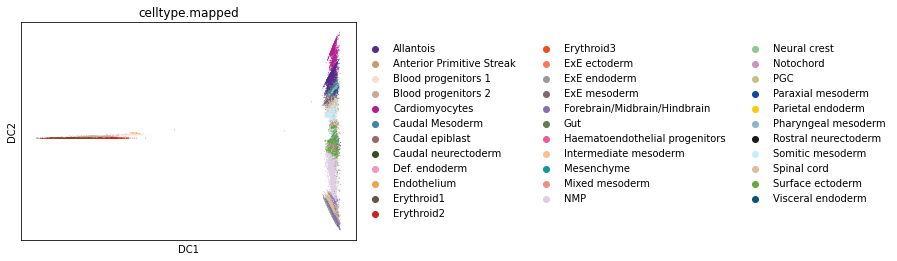

In [68]:
sc.pl.diffmap(adata_chim, color=['celltype.mapped'], save="diffusion map Mixl1 chimera" )#, legend_loc='on data')

In [ ]:
#whole atlas

In [57]:
sc.pp.neighbors(adata, n_neighbors=15) 

In [58]:
sc.tl.umap(adata)

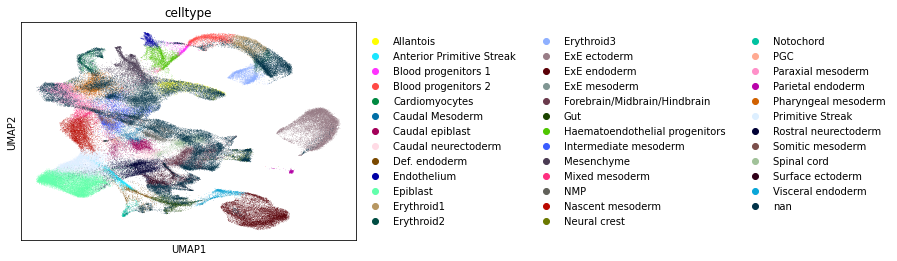

In [60]:
sc.pl.umap(adata, color = 'celltype')

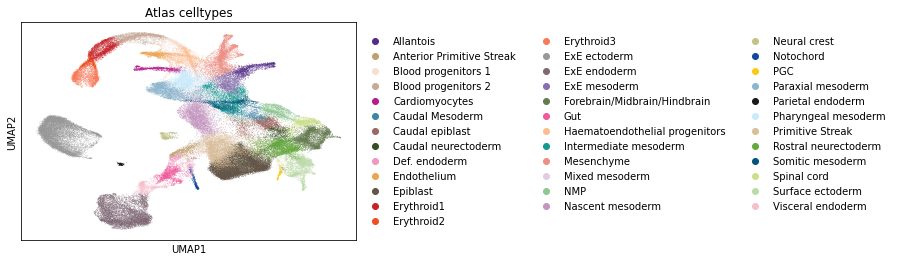

In [53]:
sc.pl.umap(adata_atlas, color = 'celltype', save='Atlas celltypes', title="Atlas celltypes")

In [ ]:
sc.tl.diffmap(adata_atlas)
sc.pp.neighbors(adata_atlas, n_neighbors=10, use_rep='X_diffmap')

C:\Users\aamw4\Anaconda3\lib\site-packages\scanpy\neighbors\__init__.py:857: RuntimeWarning: divide by zero encountered in true_divide
  Q = scipy.sparse.spdiags(1.0/q, 0, W.shape[0], W.shape[0])
C:\Users\aamw4\Anaconda3\lib\site-packages\scanpy\neighbors\__init__.py:867: RuntimeWarning: divide by zero encountered in true_divide
  self.Z = scipy.sparse.spdiags(1.0/z, 0, K.shape[0], K.shape[0])


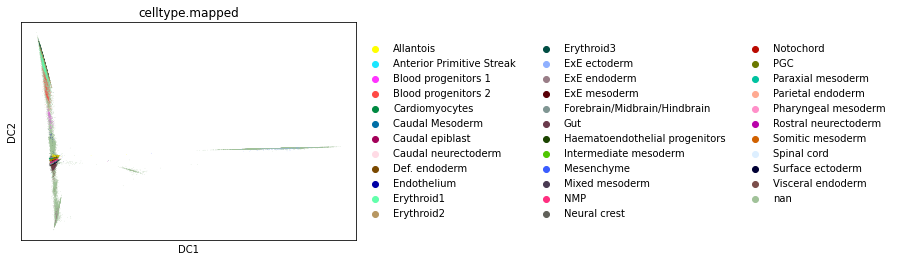

In [66]:
sc.pl.diffmap(adata_atlas, color=['celltype'])

In [ ]:
adata_chim.obs

In [ ]:
#start again here

In [46]:
pd.crosstab(adata_atlas.obs['stage']=='E6.5', adata_atlas.obs['celltype'])

celltype,Allantois,Anterior Primitive Streak,Blood progenitors 1,Blood progenitors 2,Cardiomyocytes,Caudal Mesoderm,Caudal epiblast,Caudal neurectoderm,Def. endoderm,Endothelium,...,PGC,Paraxial mesoderm,Parietal endoderm,Pharyngeal mesoderm,Primitive Streak,Rostral neurectoderm,Somitic mesoderm,Spinal cord,Surface ectoderm,Visceral endoderm
stage,,,,,,,,,,,,,,,,,,,,,
False,1820,1158,745,2587,1206,1075,2445,948,1108,1084,...,392,3811,274,3086,6884,5391,2079,1796,3522,1231
True,0,0,0,0,0,0,0,0,0,0,...,0,0,10,0,381,1,0,0,1,52


In [48]:
adata_atlas.uns['iroot'] = np.flatnonzero(adata_atlas.obs['celltype']=='Primitive Streak')[0]

In [49]:
sc.tl.dpt(adata_atlas)

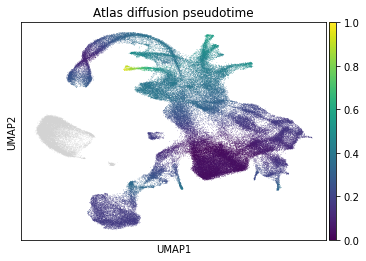

In [51]:
sc.pl.umap(adata_atlas, color = 'dpt_pseudotime', title='Atlas diffusion pseudotime', save='Atlas diffusion pseudotime-primitive streak)' )

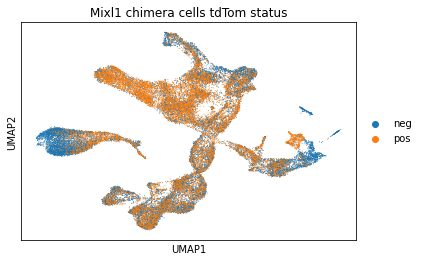

In [40]:
sc.pl.umap(adata_chim, color='tdTom', save='tdTom_mixl1_chim', title='Mixl1 chimera cells tdTom status') ##doesn't work here, but same results as Melania

In [ ]:
#realtime against PCA

In [78]:
adata_chim.obs

,sample,stage,barcode,sequencing.batch,stripped,doublet,theiler,doub.density,cluster,cluster.sub,...,endo_gutCluster,weight,stage.mapped,celltype.mapped,closest.cell,sizeFactor,tdTom,dpt_pseudotime,pca1,umap
cell,,,,,,,,,,,,,,,,,,,,,
chim_cell_1,mixl_1,E8.5,AAACCCAAGCATAGGC,1,False,False,nan,NaN,NaN,NaN,...,nan,139332,E8.25,Paraxial mesoderm,atlas_cell_74754,1.223278,neg,0.398059,-0.073768,-0.073768
chim_cell_2,mixl_1,E8.5,AAACCCAAGGGACTGT,1,False,False,nan,NaN,NaN,NaN,...,nan,139333,E8.5,Erythroid3,atlas_cell_134274,0.970827,neg,inf,0.032207,0.032207
chim_cell_3,mixl_1,E8.5,AAACCCACAAGCAATA,1,False,False,nan,NaN,NaN,NaN,...,nan,139334,E8.25,Pharyngeal mesoderm,atlas_cell_93757,1.214652,neg,0.394762,-0.078523,-0.078523
chim_cell_4,mixl_1,E8.5,AAACCCACATCTTCGC,1,False,False,nan,NaN,NaN,NaN,...,nan,139335,E8.25,Forebrain/Midbrain/Hindbrain,atlas_cell_92424,0.985727,neg,0.355295,-0.085452,-0.085452
chim_cell_5,mixl_1,E8.5,AAACCCAGTATCTCTT,1,False,False,nan,NaN,NaN,NaN,...,nan,139336,E8.5,Forebrain/Midbrain/Hindbrain,atlas_cell_38846,0.763538,neg,0.381479,-0.089429,-0.089429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chim_cell_43819,mixl_6,E8.5,TTTGGTTTCGGACCAC,1,False,False,nan,NaN,NaN,NaN,...,nan,183150,E8.0,Intermediate mesoderm,atlas_cell_121130,1.029452,pos,0.390759,-0.057393,-0.057393
chim_cell_43821,mixl_6,E8.5,TTTGTTGGTCACTTAG,1,False,False,nan,NaN,NaN,NaN,...,nan,183152,E8.25,Paraxial mesoderm,atlas_cell_63302,1.902155,pos,0.386006,-0.086777,-0.086777
chim_cell_43822,mixl_6,E8.5,TTTGTTGGTCCGACGT,1,False,False,nan,NaN,NaN,NaN,...,nan,183153,E8.5,Neural crest,atlas_cell_102526,0.839001,pos,0.405780,-0.060902,-0.060902


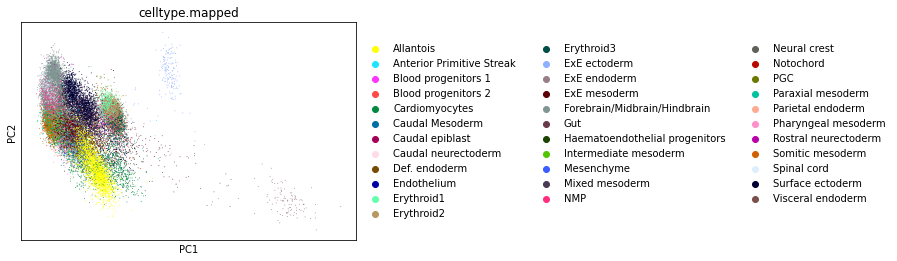

In [17]:
sc.pl.pca(adata_chim, color='celltype.mapped')

In [23]:
adata_chim.obsm['X_pca']

array([[-7.3767871793e-02, -5.8247891630e-02,  4.2525344631e-02, ...,
        -1.0093386242e-02, -9.3273144182e-03,  6.3345309404e-03],
       [ 3.2206900157e-02, -4.8079239680e-02, -3.1374569866e-01, ...,
        -7.2729115223e-04,  1.9122101629e-02,  7.2723128202e-03],
       [-7.8523256934e-02, -4.1425964643e-02,  4.7584115801e-02, ...,
        -5.2975548651e-05,  7.8071655544e-03,  8.9857632597e-03],
       ...,
       [-6.0902134387e-02, -6.7644912677e-03, -2.8493151698e-02, ...,
         4.9187180796e-03, -2.0162841011e-02,  4.0963640437e-03],
       [ 2.0142432058e-03, -1.1241485368e-01,  1.0197663197e-01, ...,
        -7.1390678493e-03,  9.7208873832e-03, -1.8388759528e-02],
       [-7.4665898508e-02, -4.9692104768e-02,  3.0031178978e-02, ...,
        -2.0442046606e-02,  5.0371362657e-03,  1.1093848511e-03]])

In [86]:
adata_chim.obs.shape


(37208, 36)

In [87]:
vec = [0] * 37208

for i in range(37208):
    if adata_chim.obs['stage.mapped'][i].startswith('E'):
        vec[i] = float(str.split(adata_chim.obs['stage.mapped'][i],'E')[1])
    else :
        vec[i] = 10


In [88]:
adata_chim.obs['stage_float'] = vec

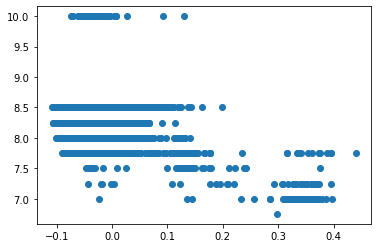

In [44]:
plt.scatter(adata_chim.obsm['X_pca'][:,0], adata_chim.obs['stage_float'])
plt.savefig('C:/USers/aamw4/home/aamw4/'+ 'Mapped stages to PC1')

In [89]:
adata_chim.obs['pca1'] = adata_chim.obsm['X_pca'][:,0]

In [90]:
adata_chim.obs['umap'] = adata_chim.obsm['X_pca'][:,0]

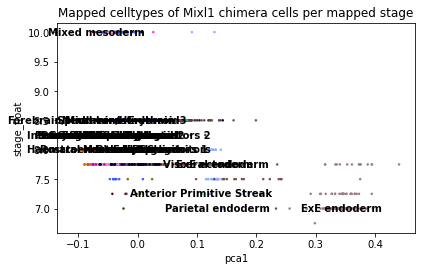

In [91]:
sc.pl.scatter(adata_chim, x='pca1', y='stage_float', color = 'celltype.mapped',size=25, legend_loc='on data', save='Mapped celltypes of Mixl1 chimera cells according to stage', title='Mapped celltypes of Mixl1 chimera cells per mapped stage' )

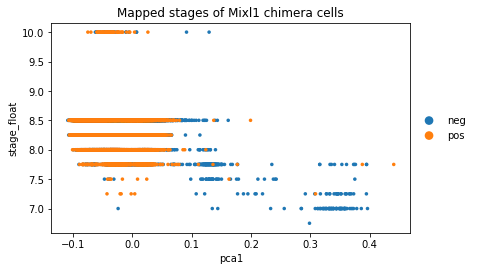

In [99]:
sc.pl.scatter(adata_chim, x='pca1', y='stage_float',color = 'tdTom',size=50, save='Mapped stages of Mixl1 chimera cells', title='Mapped stages of Mixl1 chimera cells')

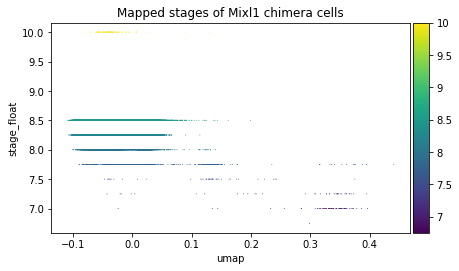

In [100]:
sc.pl.scatter(adata_chim, x="umap", y='stage_float', color='stage_float', save='Mapped stages of Mixl1 chimera cells umap', title='Mapped stages of Mixl1 chimera cells')

In [315]:
list_names = [name for name in list(df.index) if name in adata_chim.var_names]

adata_chim =  adata_chim[:,list_names].copy()

adata_chim.var_names = list(df.loc[list_names]['Associated Gene Name'])

adata_chim.var_names_make_unique()

adata_chim.var_names

Index(['mt-Cytb', 'mt-Nd6', 'mt-Nd5', 'mt-Nd4', 'mt-Nd4l', 'mt-Nd3', 'mt-Co3',
       'mt-Atp6', 'mt-Atp8', 'mt-Co2',
       ...
       'Impact', 'Dsg3', 'Fam13b', 'Rprd1a', 'Taf4b', 'Zfp521', 'Hrh4', 'Dsc1',
       'Psma8', '2700062C07Rik'],
      dtype='object', length=27917)

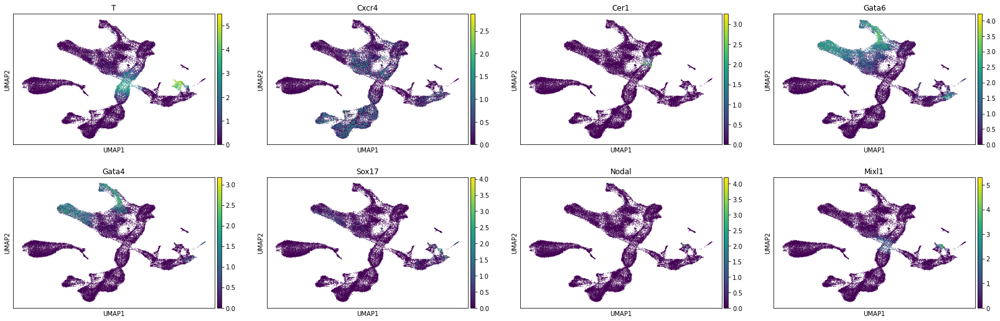

In [107]:
sc.pl.umap(adata_chim, color=["T", "Cxcr4", "Cer1", "Gata6", "Gata4", "Sox17", "Nodal", "Mixl1"], save='gene expression of Mixl1 chimera cells')

In [8]:
mixl = ["pos"]

In [159]:
adata_chim

AnnData object with n_obs × n_vars = 37208 × 27917
    obs: 'sample', 'stage', 'barcode', 'sequencing.batch', 'stripped', 'doublet', 'theiler', 'doub.density', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'weight', 'stage.mapped', 'celltype.mapped', 'closest.cell', 'sizeFactor', 'tdTom', 'comb', 'stage_float', 'pca1', 'umap', 'dpt_pseudotime', 'cell', 'meso.mapped'
    uns: 'neighbors', 'umap', 'celltype_colors', 'diffmap_evals', 'celltype.mapped_colors', 'iroot', 'tdTom_colors'
    obsm: 'X_pca', 'X_umap', 'X_diffmap'
    layers: 'logcounts'
    obsp: 'distances', 'connectivities'

In [9]:
adata_mixl = adata_chim[adata_chim.obs['tdTom'].isin(mixl),:].copy()

In [106]:
adata_mixwt = adata_chim[adata_chim.obs['tdTom']=='neg',:].copy()

In [162]:
adata_mixwt

AnnData object with n_obs × n_vars = 18107 × 27917
    obs: 'sample', 'stage', 'barcode', 'sequencing.batch', 'stripped', 'doublet', 'theiler', 'doub.density', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'weight', 'stage.mapped', 'celltype.mapped', 'closest.cell', 'sizeFactor', 'tdTom', 'comb', 'stage_float', 'pca1', 'umap', 'dpt_pseudotime', 'cell', 'meso.mapped'
    uns: 'neighbors', 'umap', 'celltype_colors', 'diffmap_evals', 'celltype.mapped_colors', 'iroot', 'tdTom_colors'
    obsm: 'X_pca', 'X_umap', 'X_diffmap'
    layers: 'logcounts'
    obsp: 'distances', 'connectivities'

In [10]:
adata_mixl

AnnData object with n_obs × n_vars = 19101 × 31217
    obs: 'sample', 'stage', 'barcode', 'sequencing.batch', 'stripped', 'doublet', 'theiler', 'doub.density', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'weight', 'stage.mapped', 'celltype.mapped', 'closest.cell', 'sizeFactor', 'tdTom'
    obsm: 'X_pca'
    layers: 'logcounts'

In [12]:
sc.pp.neighbors(adata_mixl, n_neighbors=30) 

sc.tl.umap(adata_mixl)

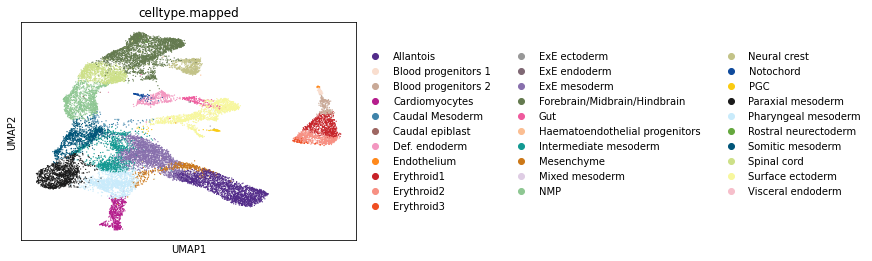

In [20]:

sc.pl.umap(adata_mixl, color='celltype.mapped', title='UMAP of Mixl-null cells', save='UMAP mixl1-null cells for gene expression pattern')

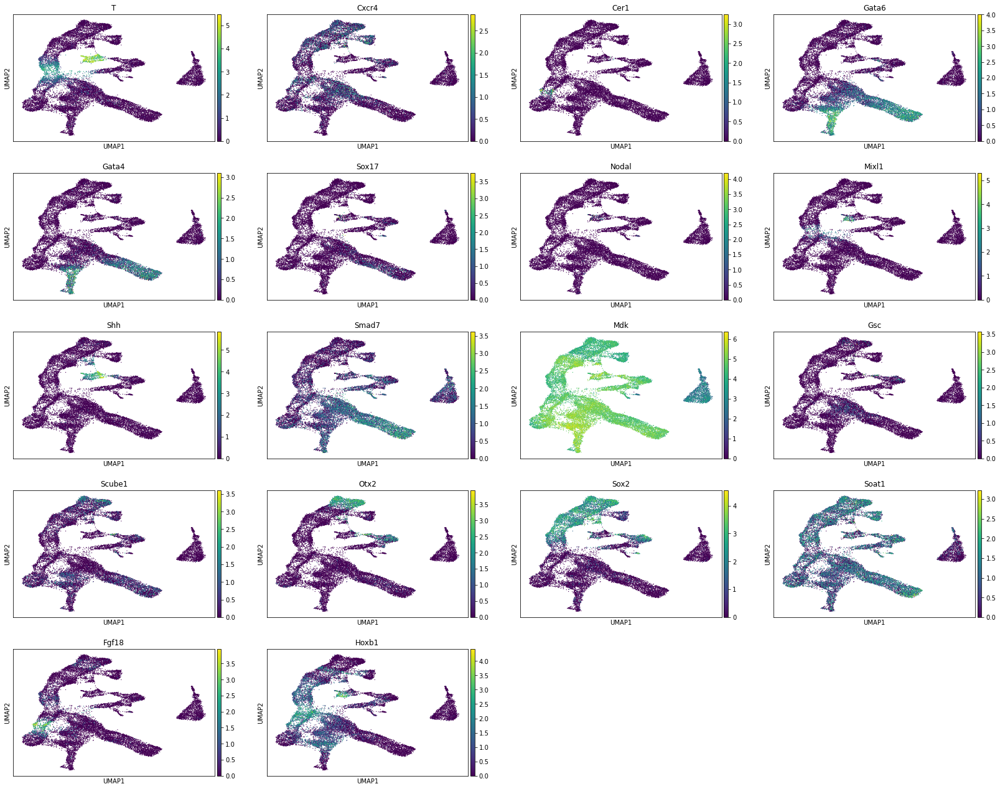

In [23]:
sc.pl.umap(adata_mixl, color=["T", "Cxcr4", "Cer1", "Gata6", "Gata4", "Sox17", "Nodal", "Mixl1", "Shh", "Smad7", "Mdk", "Gsc", "Scube1", "Otx2", "Sox2", "Soat1", "Fgf18", "Hoxb1", ], save='gene expression of Mixl1 cells')

In [22]:
sc.pl.umap(adata_mixwt, color=["T", "Cxcr4", "Cer1", "Gata6", "Gata4", "Sox17", "Nodal", "Mixl1", "Shh", "Smad7", "Mdk", "Gsc", "Scube1", "Otx2", "Sox2", "Soat1", "Fgf18", "Hoxb1", ], save='gene expression of Mixl-WT cells')

NameError: name 'adata_mixwt' is not defined

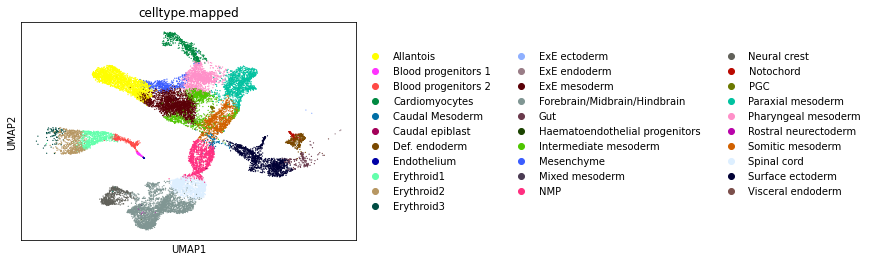

In [160]:
sc.pl.umap(adata_mixl, color="celltype.mapped")

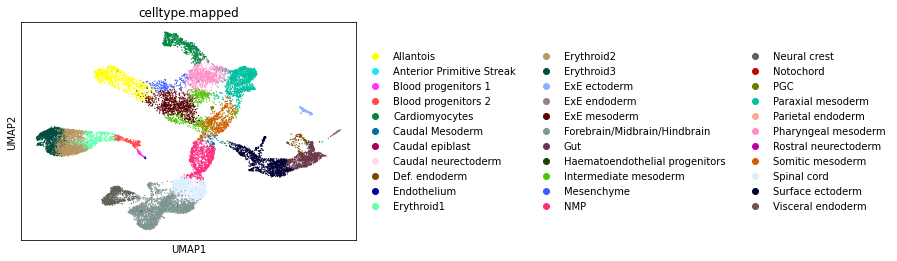

In [163]:
sc.pl.umap(adata_mixwt, color="celltype.mapped")

In [33]:
marker_genes_dict = ["T", "Cxcr4", "Cer1", "Gata6", "Gata4", "Sox17", "Nodal", "Mixl1", "Shh", ]

sc.pl.dotplot(adata_mixwt, marker_genes_dict, 'celltype.mapped', dendrogram=True)

NameError: name 'adata_mixwt' is not defined

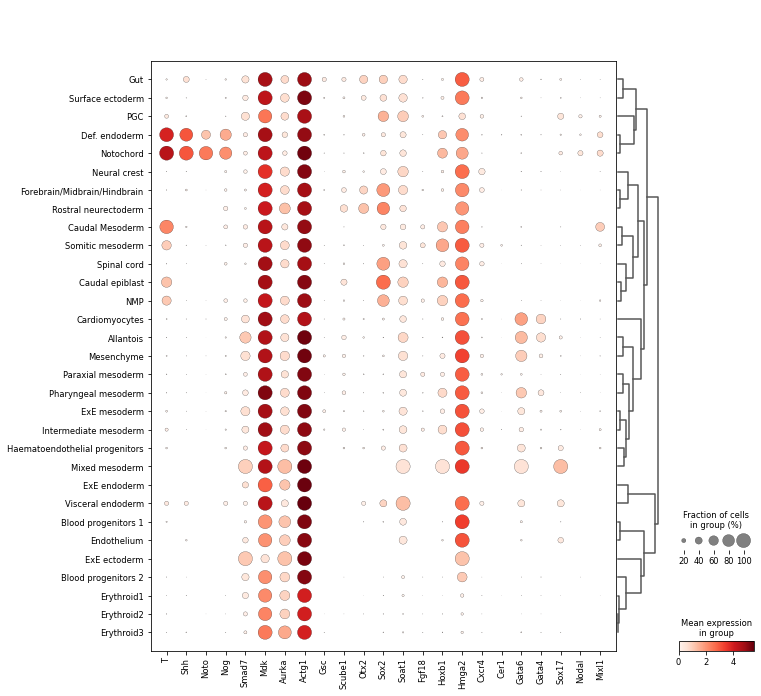

In [34]:
marker_genes_dict = ["T", "Shh", "Noto", "Nog", "Smad7", "Mdk", "Aurka", "Actg1", "Gsc", "Scube1", "Otx2", "Sox2", "Soat1", "Fgf18", "Hoxb1", "Hmga2", "Cxcr4", "Cer1", "Gata6", "Gata4", "Sox17", "Nodal", "Mixl1", ]

sc.pl.dotplot(adata_mixl, marker_genes_dict, 'celltype.mapped', dendrogram=True,  save='dotplot genes Mixl1 KO cells')

In [39]:
definitive = ['Def. endoderm', 'Gut', 'Notochord',
       'PGC', 'Surface ectoderm', 'Visceral endoderm']

In [83]:
np.unique(adata_chim.obs['celltype.mapped'])

array(['Allantois', 'Anterior Primitive Streak', 'Blood progenitors 1',
       'Blood progenitors 2', 'Cardiomyocytes', 'Caudal Mesoderm',
       'Caudal epiblast', 'Caudal neurectoderm', 'Def. endoderm',
       'Endothelium', 'Erythroid1', 'Erythroid2', 'Erythroid3',
       'ExE ectoderm', 'ExE endoderm', 'ExE mesoderm',
       'Forebrain/Midbrain/Hindbrain', 'Gut',
       'Haematoendothelial progenitors', 'Intermediate mesoderm',
       'Mesenchyme', 'Mixed mesoderm', 'NMP', 'Neural crest', 'Notochord',
       'PGC', 'Paraxial mesoderm', 'Parietal endoderm',
       'Pharyngeal mesoderm', 'Rostral neurectoderm', 'Somitic mesoderm',
       'Spinal cord', 'Surface ectoderm', 'Visceral endoderm'],
      dtype=object)

In [91]:
mesoderm = ['Cardiomyocytes', 'Caudal Mesoderm',
       'Caudal epiblast', 'Endothelium', 'ExE mesoderm',
       'Forebrain/Midbrain/Hindbrain',
       'Haematoendothelial progenitors', 'Intermediate mesoderm',
       'Mesenchyme', 'Mixed mesoderm', 'NMP', 'Neural crest', 'Paraxial mesoderm',
       'Pharyngeal mesoderm', 'Somitic mesoderm',
       'Spinal cord', 'Anterior-most_somites', 'Dermomyotome', 'Head_mesoderm',
       'Posterior-most_somites', 'Presomitic_mesoderm', 'Sclerotome' ]

In [72]:
adata_de = adata_chim[adata_chim.obs['celltype.mapped'].isin(definitive),:].copy()

In [97]:
adata_mesoderm = adata_chim[adata_chim.obs['celltype.mapped'].isin(mesoderm),:].copy()

In [98]:
adata_mesoderm

AnnData object with n_obs × n_vars = 23806 × 31217
    obs: 'sample', 'stage', 'barcode', 'sequencing.batch', 'stripped', 'doublet', 'theiler', 'doub.density', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'weight', 'stage.mapped', 'celltype.mapped', 'closest.cell', 'sizeFactor', 'tdTom'
    obsm: 'X_pca'
    layers: 'logcounts'

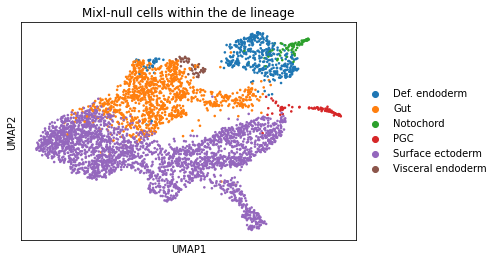

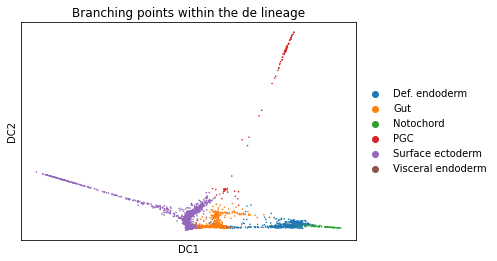

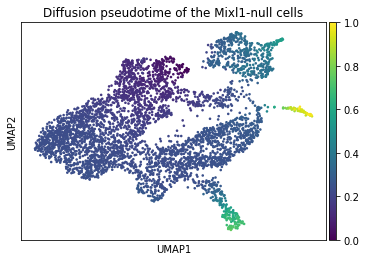

In [81]:
sc.pp.neighbors(adata_de, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_de)

sc.pl.umap(adata_de, color = 'celltype.mapped', na_color='lightgray', title='Mixl-null cells within the de lineage', save='Diffusion map of Mixl1-null cells for the de celltypes' )

sc.tl.diffmap(adata_de)

sc.pp.neighbors(adata_de, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_de, color=['celltype.mapped'], size= 10, title='Branching points within the de lineage', save='Branching points of Mixl1-null cells for the de celltypes')#, legend_loc='on data')

adata_de.uns['iroot'] = np.flatnonzero(adata_de.obs['stage.mapped']=='E7.0')[0]

sc.tl.dpt(adata_de)

sc.pl.umap(adata_de, color='dpt_pseudotime', title='Diffusion pseudotime of the Mixl1-null cells', save='Diffusion pseudotime of the Mixl1-null cells for the de celltypes')

sc.pl.umap(adata_de, color='tdTom', size=12, title='Tomato color within the de lineage', save='tdTom of Mixl1 chimera cells for the de celltypes' )

sc.pl.diffmap(adata_de, color=['tdTom'], size=12, title='Tomato color within the de lineage', save='tdTom of Mixl1 chimera cells for the de celltypes' )


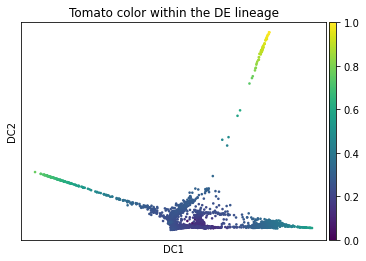

In [106]:
sc.pl.diffmap(adata_de, color='dpt_pseudotime',title='Tomato color within the DE lineage', save='tdTom of Mixl1 chimera cells for the DE celltypes')

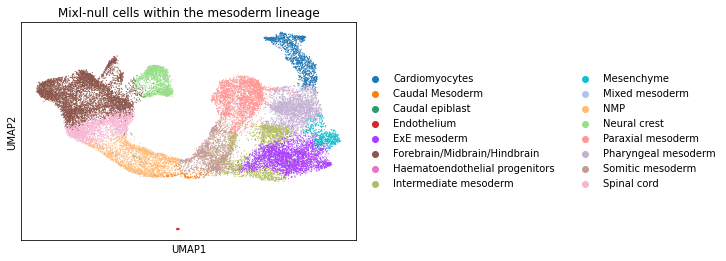

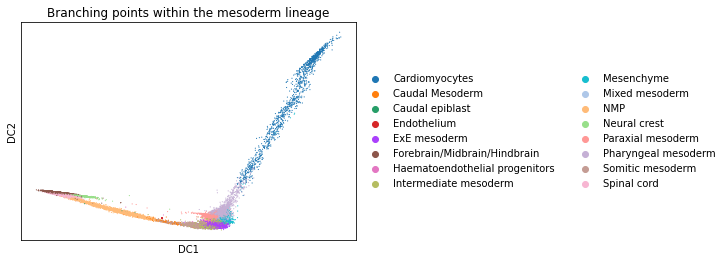

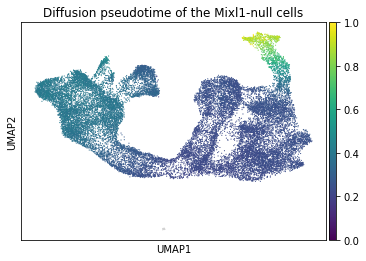

PermissionError: [Errno 13] Permission denied: 'figures\\umaptdTom of Mixl1 chimera cells for the mesoderm celltypes.pdf'

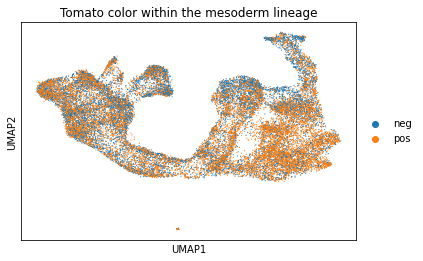

In [102]:
sc.pp.neighbors(adata_mesoderm, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_mesoderm)

sc.pl.umap(adata_mesoderm, color = 'celltype.mapped', na_color='lightgray', title='Mixl-null cells within the mesoderm lineage', save='Diffusion map of Mixl1-null cells for the mesoderm celltypes' )

sc.tl.diffmap(adata_mesoderm)

sc.pp.neighbors(adata_mesoderm, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_mesoderm, color=['celltype.mapped'], title='Branching points within the mesoderm lineage', save='Branching points of Mixl1-null cells for the mesoderm celltypes')#, legend_loc='on data')

adata_mesoderm.uns['iroot'] = np.flatnonzero(adata_mesoderm.obs['stage.mapped']=='E7.0')[0]

sc.tl.dpt(adata_mesoderm)

sc.pl.umap(adata_mesoderm, color='dpt_pseudotime', title='Diffusion pseudotime of the Mixl1-null cells', save='Diffusion pseudotime of the Mixl1-null cells for the mesoderm celltypes')

sc.pl.umap(adata_mesoderm, color='tdTom', title='Tomato color within the mesoderm lineage', save='tdTom of Mixl1 chimera cells for the mesoderm celltypes' )

sc.pl.diffmap(adata_mesoderm, color=['tdTom'], title='Tomato color within the mesoderm lineage', save='tdTom of Mixl1 chimera cells for the mesoderm celltypes' )


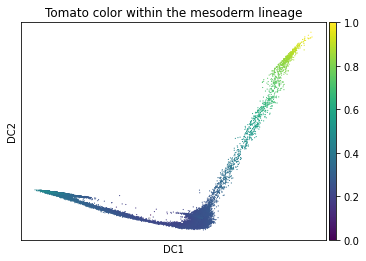

In [107]:
sc.pl.diffmap(adata_mesoderm, color='dpt_pseudotime', title='Tomato color within the mesoderm lineage', save='tdTom of Mixl1 chimera cells for the mesoderm celltypes' )

In [ ]:
#use the refined populations
#do only on subsets (34 total is too much)
#recalculate the PCA's to have maximum variation
#do what we did here but for less celltypes total

In [302]:
# add meso clusters
chim_tab = pd.read_csv('C:/Users/aamw4/home/aamw4/big_meta_mapping+meso3.tab', '\t')
meso_subclust = chim_tab[['cell', 'meso.mapped']]
meso_subclust.index = meso_subclust.cell
adata_chim.obs = pd.merge(adata_chim.obs, meso_subclust, left_index=True, right_index=True)

In [303]:
adata_chim

AnnData object with n_obs × n_vars = 37208 × 31217
    obs: 'sample', 'stage', 'barcode', 'sequencing.batch', 'stripped', 'doublet', 'theiler', 'doub.density', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'weight', 'stage.mapped', 'celltype.mapped', 'closest.cell', 'sizeFactor', 'tdTom', 'cell', 'meso.mapped'
    uns: 'neighbors', 'umap', 'diffmap_evals', 'paga', 'celltype.mapped_sizes', 'celltype.mapped_colors'
    obsm: 'X_pca', 'X_umap', 'X_diffmap'
    layers: 'logcounts'
    obsp: 'distances', 'connectivities'

#adata_wt WT chimera
string = '-1'
# add gut clusters
wt_tab = pd.read_csv('C:/Users/aamw4/home/aamw4/big_meta_mapping+haem+meso+gut.tab', '\t')
gut_subclust = wt_tab[['cell', 'gut_subclust.mapped']]
gut_subclust.cell = [cell + string for cell in gut_subclust.cell]
gut_subclust.index = gut_subclust.cell
adata_chim.obs = pd.merge(adata_chim.obs, gut_subclust, left_index=True, right_index=True)
#adata.obs = adata.obs.set_index('cell', drop=True)

# add haem clusters
#haem_subclust = pd.read_csv('C:/Users/aamw4/home/aamw4/big_meta_mapping+haem+meso+gut.tab', '\t')
haem_subclust = wt_tab[['cell', 'haem_subclust.mapped']]
haem_subclust.cell = [cell + string for cell in haem_subclust.cell]
haem_subclust.index = haem_subclust.cell
adata_chim.obs = pd.merge(adata_chim.obs, haem_subclust, left_index=True, right_index=True)
#adata.obs = adata.obs.set_index('cell', drop=True)


# add meso clusters
#meso_subclust = pd.read_csv('C:/Users/aamw4/home/aamw4/big_meta_mapping+haem+meso+gut.tab', '\t')
meso_subclust = wt_tab[['cell', 'meso.mapped']]
meso_subclust.cell = [cell + string for cell in meso_subclust.cell]
meso_subclust.index = meso_subclust.cell
adata_chim.obs = pd.merge(adata_chim.obs, meso_subclust, left_index=True, right_index=True)
#adata.obs = adata.obs.set_index('cell', drop=True)

In [82]:
meso = ['Anterior-most_somites', 'Dermomyotome', 'Head_mesoderm',
       'Posterior-most_somites', 'Presomitic_mesoderm', 'Sclerotome']

In [83]:
adata_meso = adata_chim[adata_chim.obs['meso.mapped'].isin(meso),:].copy()

In [103]:
adata_meso.obs.columns

Index(['sample', 'stage', 'barcode', 'sequencing.batch', 'stripped', 'doublet',
       'theiler', 'doub.density', 'cluster', 'cluster.sub', 'cluster.stage',
       'cluster.theiler', 'celltype', 'colour', 'umapX', 'umapY',
       'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX',
       'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX',
       'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'weight', 'stage.mapped',
       'celltype.mapped', 'closest.cell', 'sizeFactor', 'tdTom', 'comb',
       'cell', 'meso.mapped'],
      dtype='object')

In [104]:
sc.tl.pca(adata_meso, svd_solver='arpack')

... storing 'meso.mapped' as categorical


PermissionError: [Errno 13] Permission denied: 'figures\\pcaPCAs of Mixl1 chimera cells.pdf'

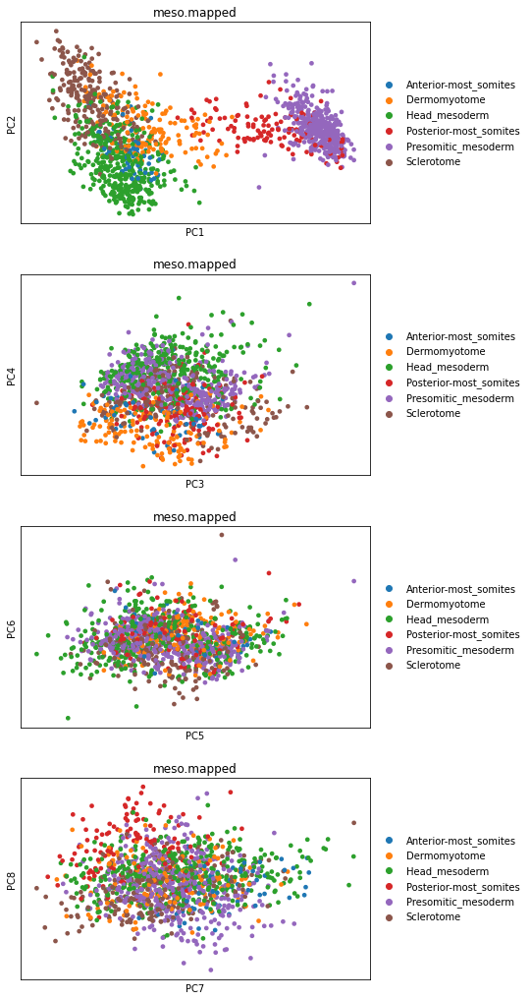

In [105]:
sc.pl.pca(adata_meso, color='meso.mapped', components = ['1,2','3,4','5,6','7,8'], ncols=1, save='PCAs of Mixl1 chimera cells')

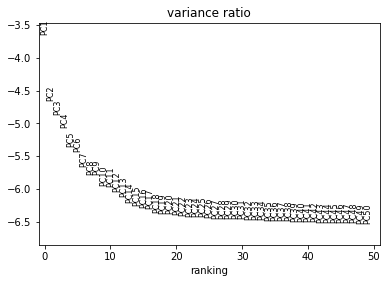

In [113]:
sc.pl.pca_variance_ratio(adata_meso, log=True, n_pcs = 50)

In [106]:
sc.pp.neighbors(adata_meso, n_neighbors = 30)


In [107]:
sc.tl.umap(adata_meso)

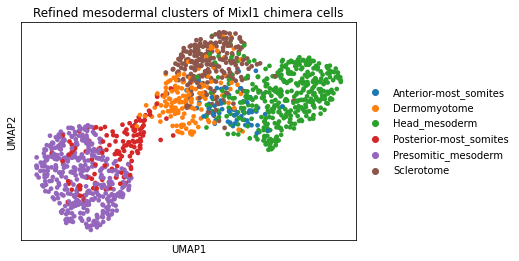

In [121]:
sc.pl.umap(adata_meso, color='meso.mapped', title='Refined mesodermal clusters of Mixl1 chimera cells', save='Umap of meso Mixl1 chimera cells')


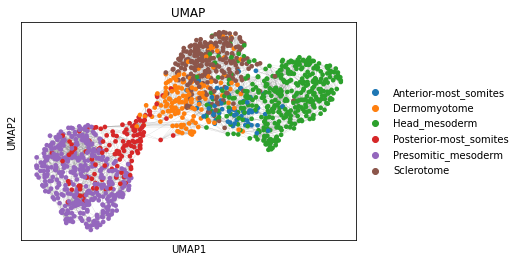

In [120]:
sc.pl.umap(adata_meso, color='meso.mapped', title="UMAP", edges=True)

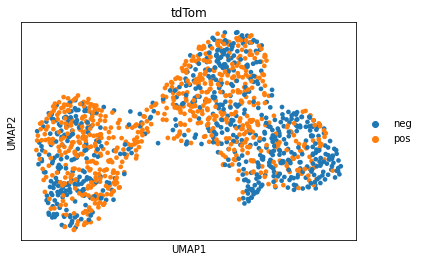

In [123]:
sc.pl.umap(adata_meso, color='tdTom', save='tdTom of meso Mixl1 chimera cells')


PermissionError: [Errno 13] Permission denied: 'figures\\diffmapDiffmap of meso Mixl1 chimera cells.pdf'

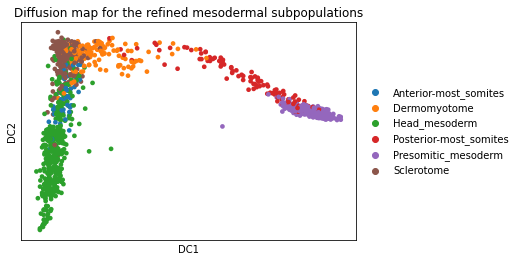

In [108]:
sc.tl.diffmap(adata_meso)
sc.pp.neighbors(adata_meso, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_meso, color=['meso.mapped'], title='Diffusion map for the refined mesodermal subpopulations', save='Diffmap of meso Mixl1 chimera cells' )#, legend_loc='on data')

In [116]:
np.unique(adata_mesowt.obs['celltype.mapped'])

array(['Caudal Mesoderm', 'Intermediate mesoderm', 'NMP', 'Neural crest',
       'Paraxial mesoderm', 'Pharyngeal mesoderm', 'Somitic mesoderm'],
      dtype=object)

In [126]:
np.unique(adata_mesochim.obs['celltype.mapped'])

array(['Caudal Mesoderm', 'Intermediate mesoderm', 'NMP', 'Neural crest',
       'Paraxial mesoderm', 'Somitic mesoderm', 'Visceral endoderm'],
      dtype=object)

In [122]:
np.unique(adata_meso.obs['celltype.mapped'])

array(['Caudal Mesoderm', 'Intermediate mesoderm', 'NMP', 'Neural crest',
       'Paraxial mesoderm', 'Pharyngeal mesoderm', 'Somitic mesoderm',
       'Visceral endoderm'], dtype=object)

In [119]:
sc.pl.scatter(adata_meso, x='pca1', y='stage_float', color = 'celltype.mapped',size=25, legend_loc='on data', save='Mapped celltypes of Mixl1 chimera cells according to meso stage', title='Mapped celltypes of Mixl1 chimera cells per mapped stage' )

ValueError: `x`, `y`, and potential `color` inputs must all come from either `.obs` or `.var`

PermissionError: [Errno 13] Permission denied: 'figures\\umapDiffusion pseudotime for the refined mesodermal subpopulations Mixl1.pdf'

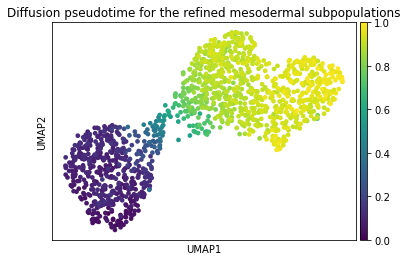

In [124]:
adata_meso.uns['iroot'] = np.flatnonzero(adata_meso.obs['celltype.mapped']=='Caudal Mesoderm')[0]

sc.tl.dpt(adata_meso)

sc.pl.umap(adata_meso, color='dpt_pseudotime', title='Diffusion pseudotime for the refined mesodermal subpopulations', save='Diffusion pseudotime for the refined mesodermal subpopulations Mixl1') 

In [111]:
adata_mesochim = adata_meso[adata_meso.obs['tdTom']=='pos',:].copy()

adata_mesowt = adata_meso[adata_meso.obs['tdTom']=='neg',:].copy()

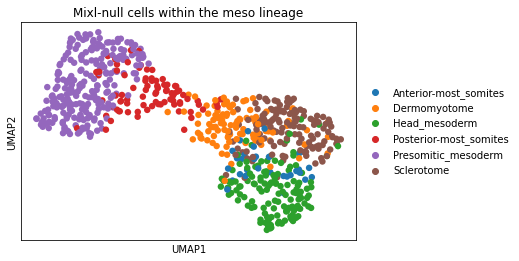

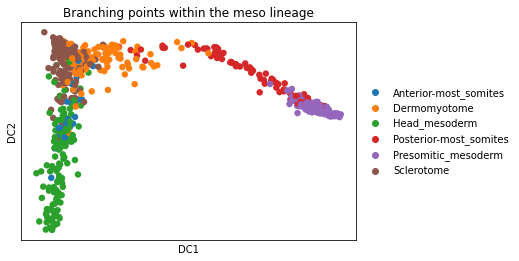

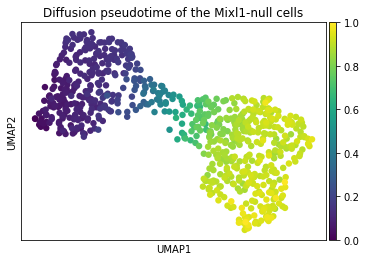

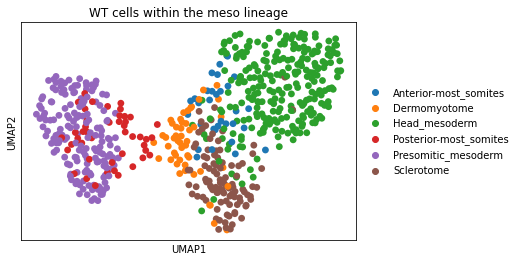

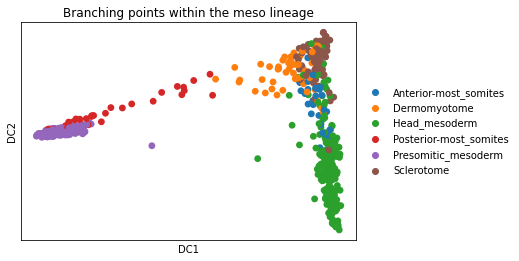

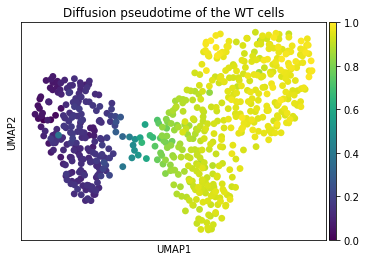

In [127]:
sc.pp.neighbors(adata_mesochim, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_mesochim)

sc.pl.umap(adata_mesochim, color = 'meso.mapped', na_color='lightgray', title='Mixl-null cells within the meso lineage', save='Diffusion map of Mixl1-null cells for the meso celltypes' )

sc.tl.diffmap(adata_mesochim)

sc.pp.neighbors(adata_mesochim, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_mesochim, color=['meso.mapped'], title='Branching points within the meso lineage', save='Branching points of Mixl1-null cells for the meso celltypes'  )#, legend_loc='on data')

adata_mesochim.uns['iroot'] = np.flatnonzero(adata_mesochim.obs['celltype.mapped']=='Caudal Mesoderm')[0]

sc.tl.dpt(adata_mesochim)

sc.pl.umap(adata_mesochim, color='dpt_pseudotime', title='Diffusion pseudotime of the Mixl1-null cells', save='Diffusion pseudotime of the Mixl1-null cells for the meso celltypes')

sc.pp.neighbors(adata_mesowt, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_mesowt)

sc.pl.umap(adata_mesowt, color = 'meso.mapped', na_color='lightgray', title='WT cells within the meso lineage', save='Diffusion map of Mixl1-WT cells for the meso celltypes' )

sc.tl.diffmap(adata_mesowt)

sc.pp.neighbors(adata_mesowt, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_mesowt, color=['meso.mapped'], title='Branching points within the meso lineage', save='Branching points of Mixl1-WT cells for the meso celltypes'  )#, legend_loc='on data')

adata_mesowt.uns['iroot'] = np.flatnonzero(adata_mesowt.obs['celltype.mapped']=='Caudal Mesoderm')[0]

sc.tl.dpt(adata_mesowt)

sc.pl.umap(adata_mesowt, color='dpt_pseudotime', title='Diffusion pseudotime of the WT cells', save='Diffusion pseudotime of the Mixl1-WT cells for the meso celltypes')

In [314]:
df = pd.read_csv('C:/Users/aamw4/home/aamw4/ensembl_gene_table_81.txt', header=0, sep='\t', index_col=0)
df

,Associated Gene Name,Gene type
Ensembl Gene ID,,
ENSMUSG00000064372,mt-Tp,Mt_tRNA
ENSMUSG00000064371,mt-Tt,Mt_tRNA
ENSMUSG00000064370,mt-Cytb,protein_coding
ENSMUSG00000064369,mt-Te,Mt_tRNA
ENSMUSG00000064368,mt-Nd6,protein_coding
...,...,...
ENSMUSG00000097611,RP24-152F23.3,protein_coding
ENSMUSG00000107101,RP23-465P18.1,antisense
ENSMUSG00000097395,RP24-152F23.5,protein_coding


In [133]:
list_names = [name for name in list(df.index) if name in adata_meso.var_names]

adata_meso =  adata_meso[:,list_names].copy()

adata_meso.var_names = list(df.loc[list_names]['Associated Gene Name'])

adata_meso.var_names_make_unique()

adata_meso.var_names

IndexError: arrays used as indices must be of integer (or boolean) type

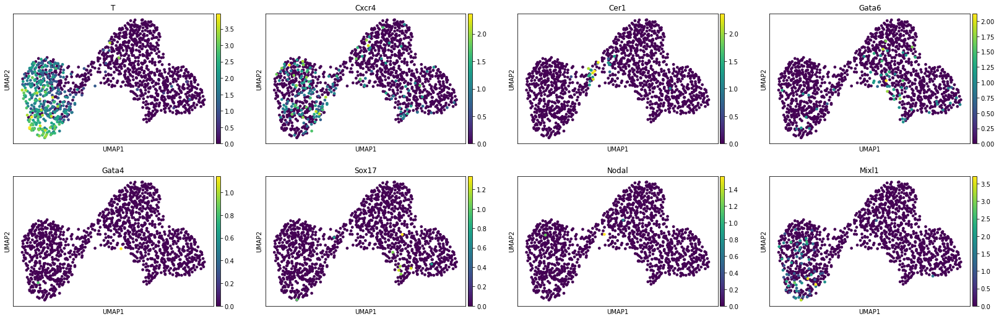

In [134]:
sc.pl.umap(adata_meso, color=["T", "Cxcr4", "Cer1", "Gata6", "Gata4", "Sox17", "Nodal", "Mixl1"], save='gene expression meso Mixl1 chimera')

In [170]:
marker_genes_dict = ["T", "Cxcr4", "Cer1", "Gata6", "Gata4", "Sox17", "Nodal", "Mixl1", "Shh", ]

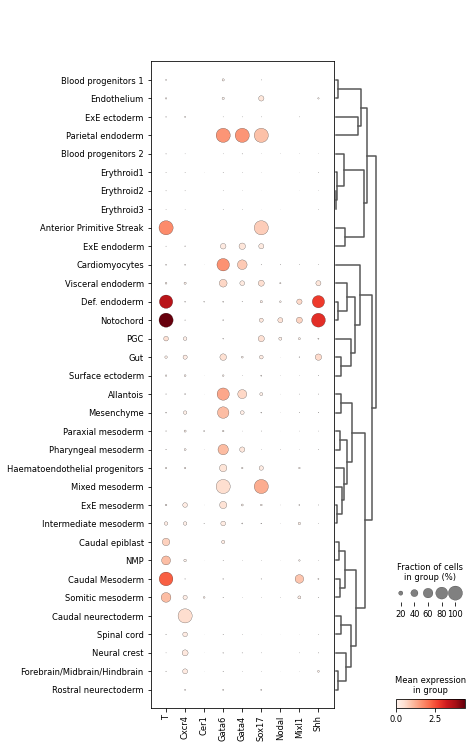

In [172]:
sc.pl.dotplot(adata_chim, marker_genes_dict, 'celltype.mapped', dendrogram=True)

In [75]:
np.unique(adata_atlas.obs['celltype'])


array(['Allantois', 'Anterior Primitive Streak', 'Blood progenitors 1',
       'Blood progenitors 2', 'Cardiomyocytes', 'Caudal Mesoderm',
       'Caudal epiblast', 'Caudal neurectoderm', 'Def. endoderm',
       'Endothelium', 'Epiblast', 'Erythroid1', 'Erythroid2',
       'Erythroid3', 'ExE ectoderm', 'ExE endoderm', 'ExE mesoderm',
       'Forebrain/Midbrain/Hindbrain', 'Gut',
       'Haematoendothelial progenitors', 'Intermediate mesoderm',
       'Mesenchyme', 'Mixed mesoderm', 'NMP', 'Nascent mesoderm',
       'Neural crest', 'Notochord', 'PGC', 'Paraxial mesoderm',
       'Parietal endoderm', 'Pharyngeal mesoderm', 'Primitive Streak',
       'Rostral neurectoderm', 'Somitic mesoderm', 'Spinal cord',
       'Surface ectoderm', 'Visceral endoderm'], dtype=object)

In [122]:
haem = ['Blood progenitors 1',
       'Blood progenitors 2', 
       'Erythroid1', 'Erythroid2',
       'Erythroid3', 'Haematoendothelial progenitors', 'Endothelium', 'Intermediate mesoderm', 'Mesenchyme', 'ExE mesoderm' ]

In [123]:
adata_haem = adata_chim[adata_chim.obs['celltype.mapped'].isin(haem),:].copy()

In [58]:
adata_wtchim = adata_chim[adata_chim.obs['tdTom']=='neg',:].copy()

In [63]:
adata_chimchim = adata_chim[adata_chim.obs['tdTom']=='pos',:].copy()

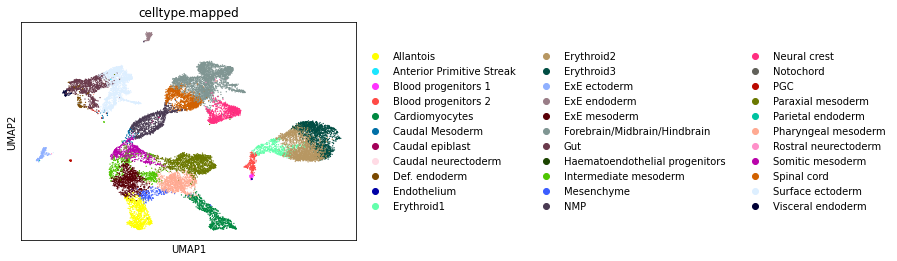

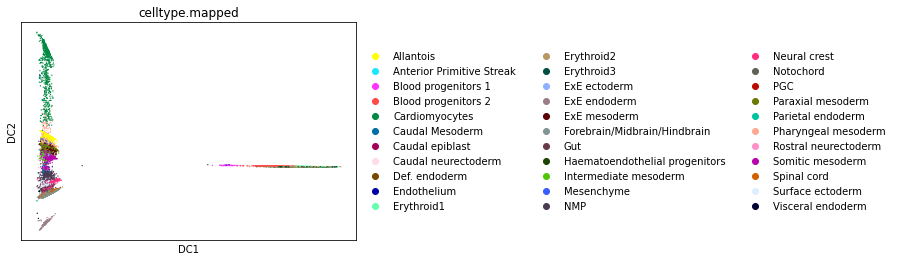

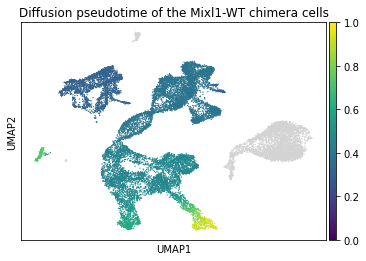

In [150]:
sc.pp.neighbors(adata_wtchim, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_wtchim)

sc.pl.umap(adata_wtchim, color = 'celltype.mapped', na_color='lightgray', save="celltype mapped of mixl1-wt cells")

sc.tl.diffmap(adata_wtchim)

sc.pp.neighbors(adata_wtchim, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_wtchim, color=['celltype.mapped'] )#, legend_loc='on data')

adata_wtchim.uns['iroot'] = np.flatnonzero(adata_wtchim.obs['celltype.mapped']=='Anterior Primitive Streak')[0]

sc.tl.dpt(adata_wtchim)

sc.pl.umap(adata_wtchim, color='dpt_pseudotime', title='Diffusion pseudotime of the Mixl1-WT chimera cells', save='Diffusion pseudotime of the Mixl1-WT chimera cells') 

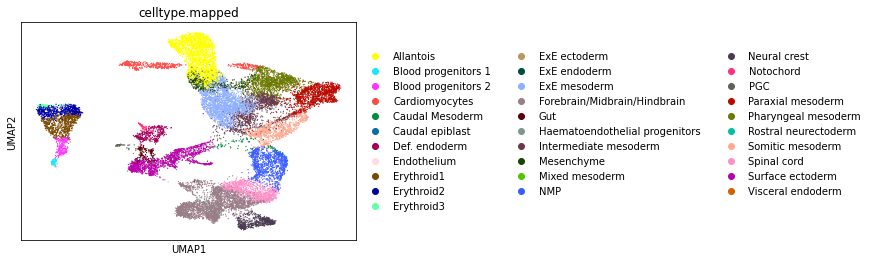

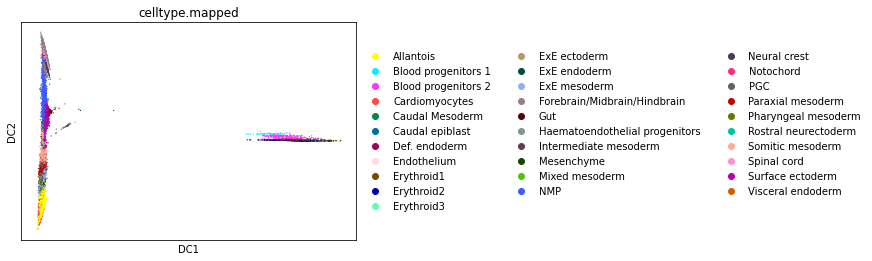

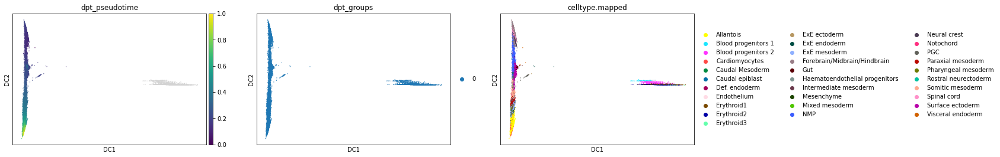

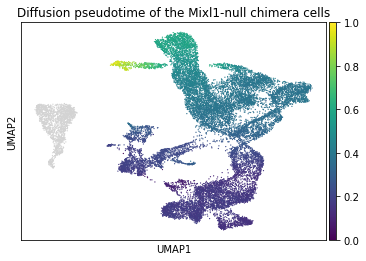

In [296]:
sc.pp.neighbors(adata_chimchim, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_chimchim)

sc.pl.umap(adata_chimchim, color = 'celltype.mapped', na_color='lightgray', save='celltype mapped of the Mixl1-null chimera cells')

sc.tl.diffmap(adata_chimchim)

sc.pp.neighbors(adata_chimchim, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_chimchim, color=['celltype.mapped'] )#, legend_loc='on data')

adata_chimchim.uns['iroot'] = np.flatnonzero(adata_chimchim.obs['celltype.mapped']=='Visceral endoderm')[0]

sc.tl.dpt(adata_chimchim)
sc.pl.diffmap(adata_chimchim, color=['dpt_pseudotime', 'dpt_groups', 'celltype.mapped'])

sc.pl.umap(adata_chimchim, color='dpt_pseudotime', title='Diffusion pseudotime of the Mixl1-null chimera cells', save='Diffusion pseudotime of the Mixl1-null chimera cells')

In [94]:
adata_haemchim = adata_haem[adata_haem.obs['tdTom']=='pos',:].copy()

adata_haemwt = adata_haem[adata_haem.obs['tdTom']=='neg',:].copy()

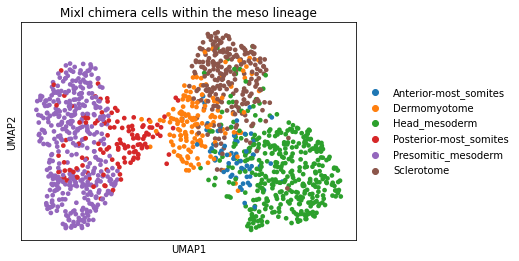

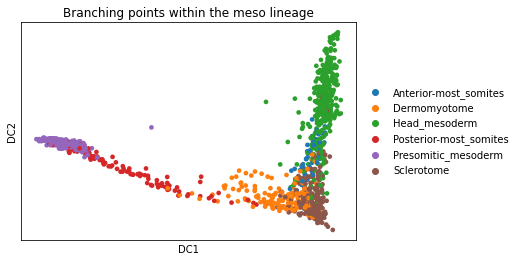

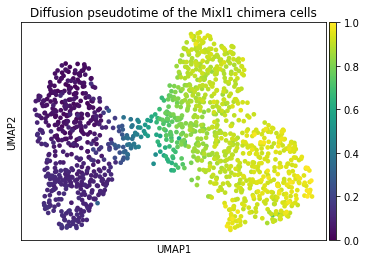

In [329]:
sc.pp.neighbors(adata_meso, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_meso)

sc.pl.umap(adata_meso, color = 'meso.mapped', na_color='lightgray', title='Mixl chimera cells within the meso lineage', save='Diffusion map of Mixl1 chimera cells for the mesoatological celltypes' )

sc.tl.diffmap(adata_meso)

sc.pp.neighbors(adata_meso, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_meso, color=['meso.mapped'], title='Branching points within the meso lineage', save='Branching points of Mixl1 chimera cells for the meso celltypes' )#, legend_loc='on data')

adata_meso.uns['iroot'] = np.flatnonzero(adata_meso.obs['meso.mapped']=='Presomitic_mesoderm')[0]

sc.tl.dpt(adata_meso)

sc.pl.umap(adata_meso, color='dpt_pseudotime', title='Diffusion pseudotime of the Mixl1 chimera cells', save='Diffusion pseudotime of the Mixl1 chimera cells for the meso celltypes')


In [333]:
adata.obs

,sample,stage,barcode,sequencing.batch,stripped,doublet,theiler,doub.density,cluster,cluster.sub,...,endo_gutX,endo_gutY,endo_gutDPT,endo_gutCluster,weight,stage.mapped,celltype.mapped,closest.cell,sizeFactor,tdTom
cell,,,,,,,,,,,,,,,,,,,,,
atlas_cell_1,atlas_1,E6.5,AAAGGCCTCCACAA,1,False,False,TS9,0.043114,2.0,4.0,...,NaN,NaN,NaN,nan,1,nan,nan,nan,0.532857,nan
atlas_cell_2,atlas_1,E6.5,AACAAACTCGCCTT,1,False,False,TS9,1.129713,12.0,1.0,...,NaN,NaN,NaN,nan,2,nan,nan,nan,1.118106,nan
atlas_cell_5,atlas_1,E6.5,AACAGAGAATCAGC,1,False,False,TS9,0.112121,3.0,7.0,...,NaN,NaN,NaN,nan,5,nan,nan,nan,0.899761,nan
atlas_cell_6,atlas_1,E6.5,AACATATGAATCGC,1,False,False,TS9,1.254709,1.0,1.0,...,NaN,NaN,NaN,nan,6,nan,nan,nan,1.213771,nan
atlas_cell_8,atlas_1,E6.5,AACCGATGGCTTCC,1,False,False,TS9,1.345759,2.0,1.0,...,NaN,NaN,NaN,nan,8,nan,nan,nan,1.273312,nan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chim_cell_43819,mixl_6,E8.5,TTTGGTTTCGGACCAC,1,False,False,nan,NaN,NaN,NaN,...,NaN,NaN,NaN,nan,183150,E8.0,Intermediate mesoderm,atlas_cell_121130,1.029452,pos
chim_cell_43821,mixl_6,E8.5,TTTGTTGGTCACTTAG,1,False,False,nan,NaN,NaN,NaN,...,NaN,NaN,NaN,nan,183152,E8.25,Paraxial mesoderm,atlas_cell_63302,1.902155,pos
chim_cell_43822,mixl_6,E8.5,TTTGTTGGTCCGACGT,1,False,False,nan,NaN,NaN,NaN,...,NaN,NaN,NaN,nan,183153,E8.5,Neural crest,atlas_cell_102526,0.839001,pos


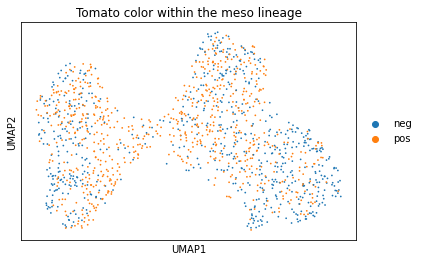

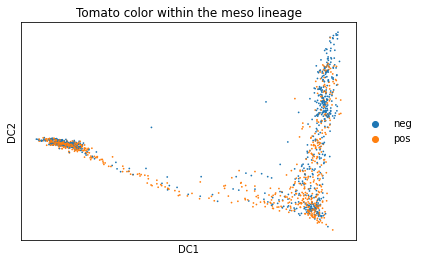

In [331]:
sc.pl.umap(adata_meso, color='tdTom', size=12, title='Tomato color within the meso lineage', save='tdTom of Mixl1 chimera cells for the meso celltypes' )
sc.pl.diffmap(adata_meso, color=['tdTom'], size=12, title='Tomato color within the meso lineage', save='tdTom of Mixl1 chimera cells for the meso celltypes' )


In [111]:
np.unique(adata_haem.obs['stage.mapped'])

array(['E7.0', 'E7.5', 'E7.75', 'E8.0', 'E8.25', 'E8.5',
       'mixed_gastrulation'], dtype=object)

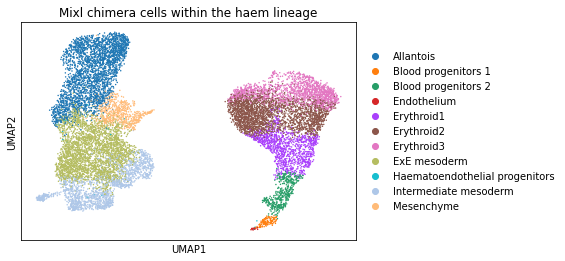

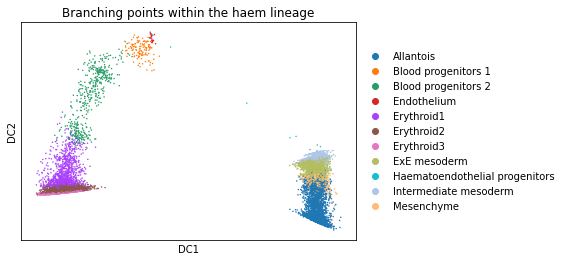

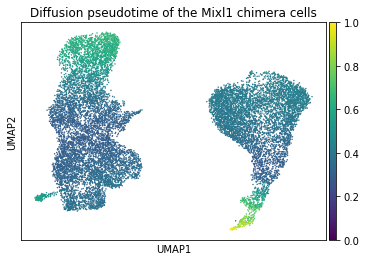

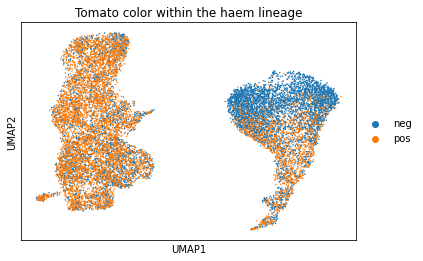

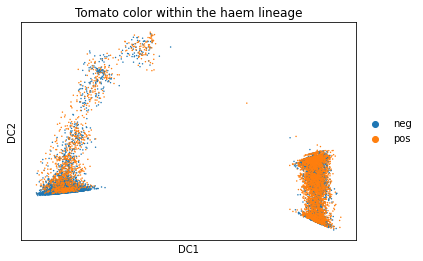

In [117]:
#with Allantois
sc.pp.neighbors(adata_haem, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_haem)

sc.pl.umap(adata_haem, color = 'celltype.mapped', na_color='lightgray', title='Mixl chimera cells within the haem lineage')#, save='Diffusion map of Mixl1 chimera cells for the haematological celltypes' )

sc.tl.diffmap(adata_haem)

sc.pp.neighbors(adata_haem, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_haem, color=['celltype.mapped'], title='Branching points within the haem lineage')#, save='Branching points of Mixl1 chimera cells for the haematological celltypes' )#, legend_loc='on data')

adata_haem.uns['iroot'] = np.flatnonzero(adata_haem.obs['stage.mapped']=='E7.0')[0]

sc.tl.dpt(adata_haem)

sc.pl.umap(adata_haem, color='dpt_pseudotime', title='Diffusion pseudotime of the Mixl1 chimera cells')#, save='Diffusion pseudotime of the Mixl1 chimera cells for the haematological celltypes') 

sc.pl.umap(adata_haem, color='tdTom', title='Tomato color within the haem lineage')#, save='tdTom of Mixl1 chimera cells for the haematological celltypes' )
sc.pl.diffmap(adata_haem, color=['tdTom'], title='Tomato color within the haem lineage')#, save='tdTom of Mixl1 chimera cells for the haematological celltypes' )

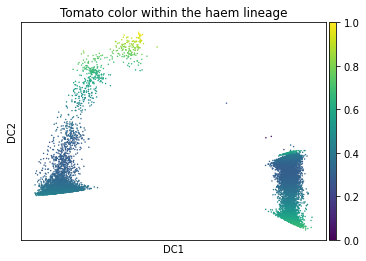

In [119]:
sc.pl.diffmap(adata_haem, color='dpt_pseudotime', title='Tomato color within the haem lineage')#, save='tdTom of Mixl1 chimera cells for the haematological celltypes' )

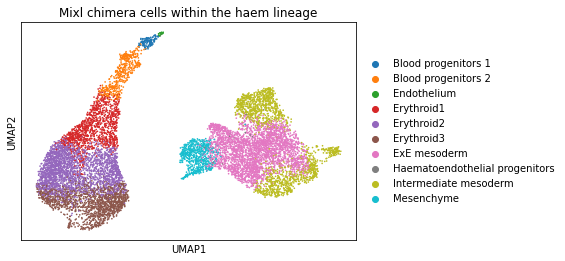

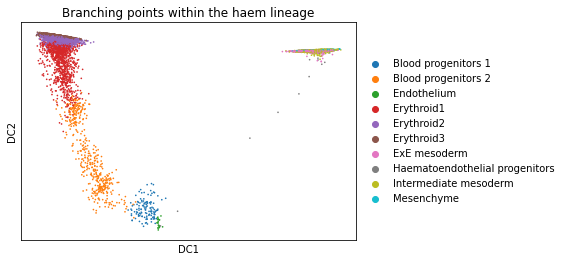

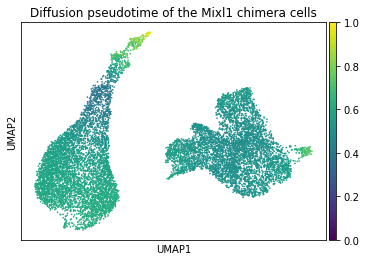

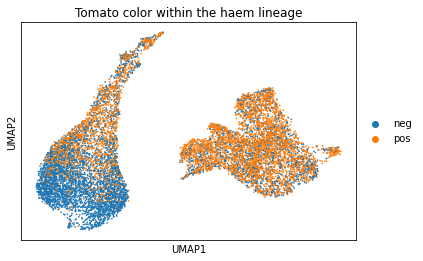

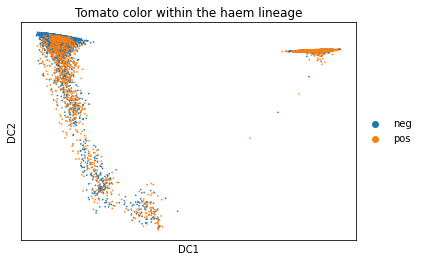

In [124]:
#no Allantois
sc.pp.neighbors(adata_haem, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_haem)

sc.pl.umap(adata_haem, color = 'celltype.mapped', na_color='lightgray', title='Mixl chimera cells within the haem lineage')#, save='Diffusion map of Mixl1 chimera cells for the haematological celltypes' )

sc.tl.diffmap(adata_haem)

sc.pp.neighbors(adata_haem, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_haem, color=['celltype.mapped'], title='Branching points within the haem lineage')#, save='Branching points of Mixl1 chimera cells for the haematological celltypes' )#, legend_loc='on data')

adata_haem.uns['iroot'] = np.flatnonzero(adata_haem.obs['stage.mapped']=='E7.0')[0]

sc.tl.dpt(adata_haem)

sc.pl.umap(adata_haem, color='dpt_pseudotime', title='Diffusion pseudotime of the Mixl1 chimera cells')#, save='Diffusion pseudotime of the Mixl1 chimera cells for the haematological celltypes') 

sc.pl.umap(adata_haem, color='tdTom', title='Tomato color within the haem lineage')#, save='tdTom of Mixl1 chimera cells for the haematological celltypes' )
sc.pl.diffmap(adata_haem, color=['tdTom'], title='Tomato color within the haem lineage')#, save='tdTom of Mixl1 chimera cells for the haematological celltypes' )

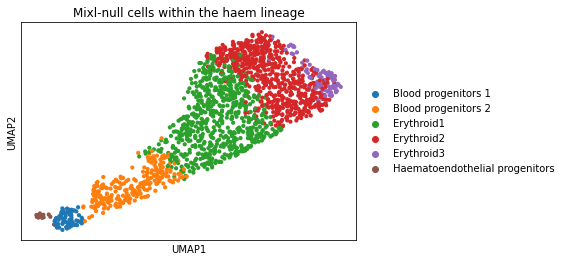

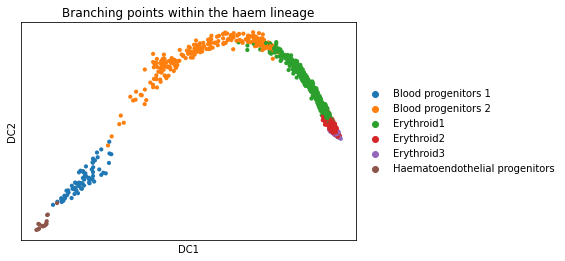

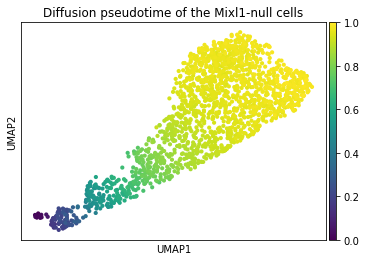

In [101]:
sc.pp.neighbors(adata_haemchim, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_haemchim)

sc.pl.umap(adata_haemchim, color = 'celltype.mapped', na_color='lightgray', title='Mixl-null cells within the haem lineage', save='Diffusion map of Mixl1-null cells for the haematological celltypes' )

sc.tl.diffmap(adata_haemchim)

sc.pp.neighbors(adata_haemchim, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_haemchim, color=['celltype.mapped'], title='Branching points within the haem lineage', save='Branching points of Mixl1-null cells for the haematological celltypes'  )#, legend_loc='on data')

adata_haemchim.uns['iroot'] = np.flatnonzero(adata_haemchim.obs['celltype.mapped']=='Haematoendothelial progenitors')[0]

sc.tl.dpt(adata_haemchim)

sc.pl.umap(adata_haemchim, color='dpt_pseudotime', title='Diffusion pseudotime of the Mixl1-null cells', save='Diffusion pseudotime of the Mixl1-null cells for the haematological celltypes')

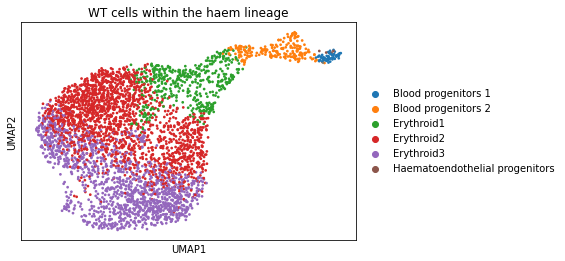

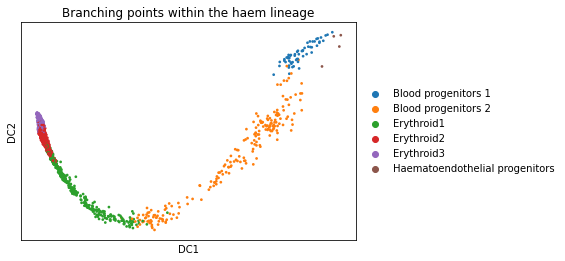

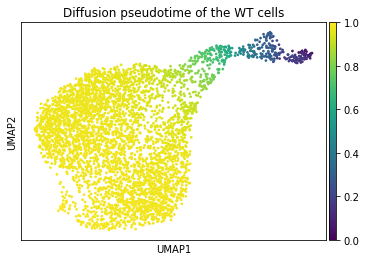

In [102]:
sc.pp.neighbors(adata_haemwt, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_haemwt)

sc.pl.umap(adata_haemwt, color = 'celltype.mapped', na_color='lightgray', title='WT cells within the haem lineage', save='Diffusion map of Mixl1-WT cells for the haematological celltypes' )

sc.tl.diffmap(adata_haemwt)

sc.pp.neighbors(adata_haemwt, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_haemwt, color=['celltype.mapped'], title='Branching points within the haem lineage', save='Branching points of Mixl1-WT cells for the haematological celltypes'  )#, legend_loc='on data')

adata_haemwt.uns['iroot'] = np.flatnonzero(adata_haemwt.obs['celltype.mapped']=='Haematoendothelial progenitors')[0]

sc.tl.dpt(adata_haemwt)

sc.pl.umap(adata_haemwt, color='dpt_pseudotime', title='Diffusion pseudotime of the WT cells', save='Diffusion pseudotime of the Mixl1-WT cells for the haematological celltypes')

In [334]:
gut_subclust = pd.read_csv('C:/Users/aamw4/home/aamw4/Mixl1/big_meta_mapping.tab', '\t')
gut_subclust = gut_subclust[['cell', 'gut_subclust.mapped']]
adata.obs = adata.obs.merge(gut_subclust, on='cell', how='left')
adata.obs = adata.obs.set_index('cell', drop=True)

AnnData expects .obs.index to contain strings, but your first indices are: Int64Index([0, 1], dtype='int64'), …


In [337]:
# add haem clusters
haem_subclust = pd.read_csv('C:/Users/aamw4/home/aamw4/big_meta_mapping_haem.tab', '\t')
haem_subclust = haem_subclust[['cell', 'haem_subclust.mapped']]
adata.obs = adata.obs.merge(haem_subclust, on='cell', how='left')
adata.obs = adata.obs.set_index('cell', drop=True)

AnnData expects .obs.index to contain strings, but your first indices are: Int64Index([0, 1], dtype='int64'), …


In [343]:
pd.unique(adata.obs["haem_subclust.mapped"])

array([nan, 'Ery3', 'Ery4', 'Ery2', 'BP2', 'Ery1', 'Mk', 'BP4', 'BP3',
       'Haem4', 'Haem3', 'My', 'Haem2', 'BP1', 'EC8'], dtype=object)

In [346]:
haem = ['Ery3', 'Ery4', 'Ery2', 'BP2', 'Ery1', 'Mk', 'BP4', 'BP3',
       'Haem4', 'Haem3', 'My', 'Haem2', 'BP1', 'EC8']

adata_rhaem = adata[adata.obs['haem_subclust.mapped'].isin(haem),:].copy()

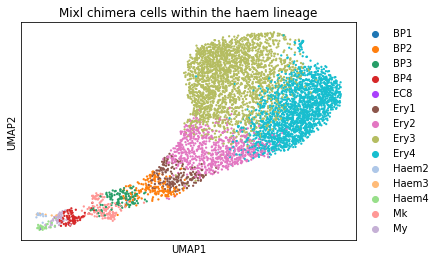

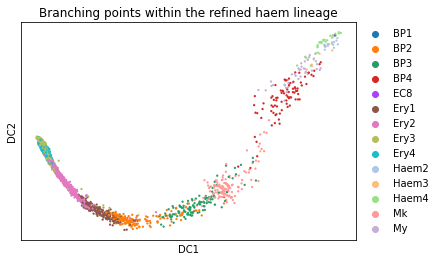

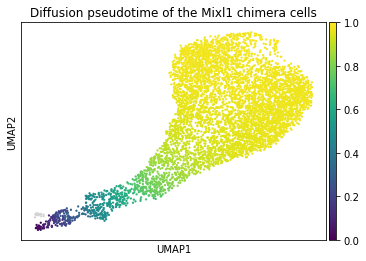

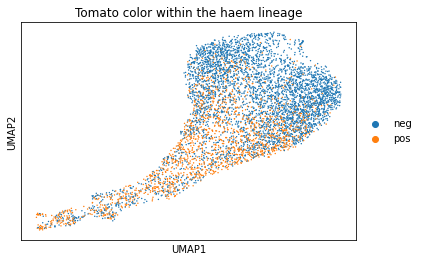

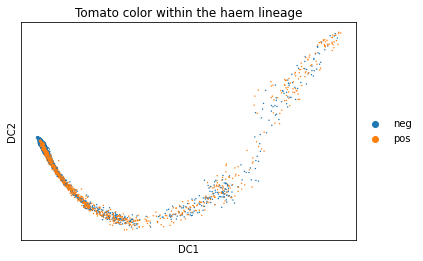

In [348]:
sc.pp.neighbors(adata_rhaem, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_rhaem)

sc.pl.umap(adata_rhaem, color = 'haem_subclust.mapped', na_color='lightgray', title='Mixl chimera cells within the haem lineage', save='Diffusion map of Mixl1 chimera cells for the refined haematological celltypes' )

sc.tl.diffmap(adata_rhaem)

sc.pp.neighbors(adata_rhaem, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_rhaem, color=['haem_subclust.mapped'], title='Branching points within the refined haem lineage', save='Branching points of Mixl1 chimera cells for the refined haematological celltypes' )#, legend_loc='on data')

adata_rhaem.uns['iroot'] = np.flatnonzero(adata_rhaem.obs['haem_subclust.mapped']=='Haem4')[0]

sc.tl.dpt(adata_rhaem)

sc.pl.umap(adata_rhaem, color='dpt_pseudotime', title='Diffusion pseudotime of the Mixl1 chimera cells', save='Diffusion pseudotime of the Mixl1 chimera cells for the refined haematological celltypes') 

sc.pl.umap(adata_rhaem, color='tdTom', size=8, title='Tomato color within the haem lineage', save='tdTom of Mixl1 chimera cells for the refined haematological celltypes' )
sc.pl.diffmap(adata_rhaem, color=['tdTom'], size=8, title='Tomato color within the haem lineage', save='tdTom of Mixl1 chimera cells for the refined haematological celltypes' )


# WT injection

In [17]:
import anndata as ad
import numpy as np
import pandas as pd

In [2]:
adata_wt = ad.read_loom('C:/Users/aamw4/home/aamw4/wt_chim_atlas_analysis.h5')

In [3]:
#subsetting only the chimera cells = won't need atlas cells for now
    
adata_wt = adata_wt[adata_wt.obs_names.str.startswith('wt'),:].copy()

In [19]:
adata_wt.obs

,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,cluster.theiler,...,sample,sequencing.batch,sizeFactor,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY
wt_cell_1-1,AAACCTGAGACCTTTG,1,nan,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_52006,NaN,NaN,NaN,NaN,...,mixl_1,1,2.022277,E7.5,E7.5,0,pos,nan,NaN,NaN
wt_cell_2-1,AAACCTGAGCGCCTCA,1,nan,Mesenchyme,Mesenchyme,atlas_cell_33502,NaN,NaN,NaN,NaN,...,mixl_1,1,2.104918,E7.5,E8.0,0,pos,nan,NaN,NaN
wt_cell_3-1,AAACCTGAGGATCGCA,1,nan,Primitive Streak,Primitive Streak,atlas_cell_112755,NaN,NaN,NaN,NaN,...,mixl_1,1,1.880656,E7.5,E7.0,0,pos,nan,NaN,NaN
wt_cell_4-1,AAACCTGCACGTAAGG,1,nan,NMP,NMP,atlas_cell_68127,NaN,NaN,NaN,NaN,...,mixl_1,1,1.365427,E7.5,E8.25,0,pos,nan,NaN,NaN
wt_cell_5-1,AAACCTGCAGACAGGT,1,nan,Caudal Mesoderm,Caudal Mesoderm,atlas_cell_68596,NaN,NaN,NaN,NaN,...,mixl_1,1,1.899682,E7.5,E8.25,0,pos,nan,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
wt_cell_13477-1,TTTGGTTGTGATGCCC,1,nan,Rostral neurectoderm,Rostral neurectoderm,atlas_cell_8750,NaN,NaN,NaN,NaN,...,mixl_6,0,0.422911,E8.5,E7.75,0,neg,nan,NaN,NaN
wt_cell_13478-1,TTTGGTTTCGCTTAGA,1,nan,Erythroid3,Erythroid3,atlas_cell_97649,NaN,NaN,NaN,NaN,...,mixl_6,0,1.336606,E8.5,E8.5,0,neg,nan,NaN,NaN
wt_cell_13479-1,TTTGTCAAGACAATAC,1,nan,Erythroid3,Erythroid3,atlas_cell_38655,NaN,NaN,NaN,NaN,...,mixl_6,0,2.407617,E8.5,E8.5,0,neg,nan,NaN,NaN
wt_cell_13480-1,TTTGTCAAGGTAGCTG,1,nan,Erythroid2,Erythroid2,atlas_cell_133630,NaN,NaN,NaN,NaN,...,mixl_6,0,2.770574,E8.5,E8.5,0,neg,nan,NaN,NaN


In [20]:
pd.crosstab(adata_wt.obs['tdTom'], adata_wt.obs['stage'])

stage,E7.5,E8.5
tdTom,,
neg,4526,1077
pos,5424,2454


In [139]:
#adata_wt WT chimera
string = '-1'
# add gut clusters
wt_tab = pd.read_csv('C:/Users/aamw4/home/aamw4/big_meta_mapping+haem+meso+gut.tab', '\t')
gut_subclust = wt_tab[['cell', 'gut_subclust.mapped']]
gut_subclust.cell = [cell + string for cell in gut_subclust.cell]
gut_subclust.index = gut_subclust.cell
adata_wt.obs = pd.merge(adata_wt.obs, gut_subclust, left_index=True, right_index=True)
#adata.obs = adata.obs.set_index('cell', drop=True)

# add haem clusters
#haem_subclust = pd.read_csv('C:/Users/aamw4/home/aamw4/big_meta_mapping+haem+meso+gut.tab', '\t')
haem_subclust = wt_tab[['cell', 'haem_subclust.mapped']]
haem_subclust.cell = [cell + string for cell in haem_subclust.cell]
haem_subclust.index = haem_subclust.cell
adata_wt.obs = pd.merge(adata_wt.obs, haem_subclust, left_index=True, right_index=True)
#adata.obs = adata.obs.set_index('cell', drop=True)


# add meso clusters
#meso_subclust = pd.read_csv('C:/Users/aamw4/home/aamw4/big_meta_mapping+haem+meso+gut.tab', '\t')
meso_subclust = wt_tab[['cell', 'meso.mapped']]
meso_subclust.cell = [cell + string for cell in meso_subclust.cell]
meso_subclust.index = meso_subclust.cell
adata_wt.obs = pd.merge(adata_wt.obs, meso_subclust, left_index=True, right_index=True)
#adata.obs = adata.obs.set_index('cell', drop=True)

In [140]:
adata_wt

AnnData object with n_obs × n_vars = 13481 × 27151
    obs: 'barcode', 'batch', 'cell_x', 'celltype', 'celltype.mapped', 'closest.cell', 'cluster', 'cluster.stage', 'cluster.sub', 'cluster.theiler', 'colour', 'doub.density', 'doublet', 'endo_gephiX', 'endo_gephiY', 'endo_gutCluster', 'endo_gutDPT', 'endo_gutX', 'endo_gutY', 'endo_trajectoryDPT', 'endo_trajectoryName', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'sample', 'sequencing.batch', 'sizeFactor', 'stage', 'stage.mapped', 'stripped', 'tdTom', 'theiler', 'umapX', 'umapY', 'cell_y', 'gut_subclust.mapped', 'cell_x', 'haem_subclust.mapped', 'cell_y', 'meso.mapped'
    uns: 'celltype.mapped_colors', 'stage.mapped_colors', 'tdTom_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'logcounts'

In [6]:
#df = pd.read_csv("/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/data/ensembl_gene_table_81.txt", delim_whitespace=True, header=None, skiprows=1, names=['Ensembl Gene ID','Associated Gene Name','Gene type']) #without naming header, didn't work
#df.columns
df = pd.read_csv('C:/Users/aamw4/home/aamw4/ensembl_gene_table_81.txt', header=0, sep='\t', index_col=0)
df

list_names = [name for name in list(df.index) if name in adata_wt.var_names]

adata_wt =  adata_wt[:,list_names].copy()

adata_wt.var_names = list(df.loc[list_names]['Associated Gene Name'])

adata_wt.var_names_make_unique()

adata_wt.var_names

Index(['mt-Cytb', 'mt-Nd6', 'mt-Nd5', 'mt-Nd4', 'mt-Nd4l', 'mt-Nd3', 'mt-Co3',
       'mt-Atp6', 'mt-Atp8', 'mt-Co2',
       ...
       'Impact', 'Dsg3', 'Fam13b', 'Rprd1a', 'Taf4b', 'Zfp521', 'Hrh4', 'Dsc1',
       'Psma8', '2700062C07Rik'],
      dtype='object', length=27151)

In [16]:
adata_wt.obs =  adata_wt.obs.drop(adata_wt.obs.columns[[34, 36, 38]], axis=1)

In [7]:
adata_wt.obs

,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,cluster.theiler,...,sample,sequencing.batch,sizeFactor,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY
atlas_cell_1-0,AAAGGCCTCCACAA,0,atlas_cell_1,Epiblast,nan,nan,2.0,2.0,4.0,3.0,...,1,1,NaN,E6.5,nan,0,nan,TS9,-10.227546,-2.881687
atlas_cell_2-0,AACAAACTCGCCTT,0,atlas_cell_2,Primitive Streak,nan,nan,12.0,1.0,1.0,1.0,...,1,1,NaN,E6.5,nan,0,nan,TS9,-6.625458,0.108961
atlas_cell_5-0,AACAGAGAATCAGC,0,atlas_cell_5,ExE ectoderm,nan,nan,3.0,4.0,7.0,6.0,...,1,1,NaN,E6.5,nan,0,nan,TS9,10.061009,-0.029313
atlas_cell_6-0,AACATATGAATCGC,0,atlas_cell_6,Epiblast,nan,nan,1.0,3.0,1.0,7.0,...,1,1,NaN,E6.5,nan,0,nan,TS9,-10.454418,-0.269452
atlas_cell_8-0,AACCGATGGCTTCC,0,atlas_cell_8,Epiblast,nan,nan,2.0,2.0,1.0,3.0,...,1,1,NaN,E6.5,nan,0,nan,TS9,-11.047206,-2.205269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
wt_cell_13477-1,TTTGGTTGTGATGCCC,1,nan,Rostral neurectoderm,Rostral neurectoderm,atlas_cell_8750,NaN,NaN,NaN,NaN,...,mixl_6,0,0.422911,E8.5,E7.75,0,neg,nan,NaN,NaN
wt_cell_13478-1,TTTGGTTTCGCTTAGA,1,nan,Erythroid3,Erythroid3,atlas_cell_97649,NaN,NaN,NaN,NaN,...,mixl_6,0,1.336606,E8.5,E8.5,0,neg,nan,NaN,NaN
wt_cell_13479-1,TTTGTCAAGACAATAC,1,nan,Erythroid3,Erythroid3,atlas_cell_38655,NaN,NaN,NaN,NaN,...,mixl_6,0,2.407617,E8.5,E8.5,0,neg,nan,NaN,NaN
wt_cell_13480-1,TTTGTCAAGGTAGCTG,1,nan,Erythroid2,Erythroid2,atlas_cell_133630,NaN,NaN,NaN,NaN,...,mixl_6,0,2.770574,E8.5,E8.5,0,neg,nan,NaN,NaN


In [30]:
#sc.tl.pca(adata_wt, svd_solver='arpack')

... storing 'barcode' as categorical
... storing 'batch' as categorical
... storing 'cell' as categorical
... storing 'celltype' as categorical
... storing 'celltype.mapped' as categorical
... storing 'closest.cell' as categorical
... storing 'colour' as categorical
... storing 'endo_gutCluster' as categorical
... storing 'endo_trajectoryName' as categorical
... storing 'haem_subclust' as categorical
... storing 'sample' as categorical
... storing 'stage' as categorical
... storing 'stage.mapped' as categorical
... storing 'tdTom' as categorical
... storing 'theiler' as categorical


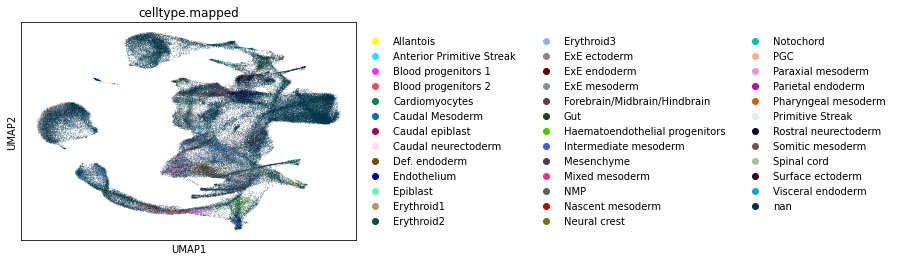

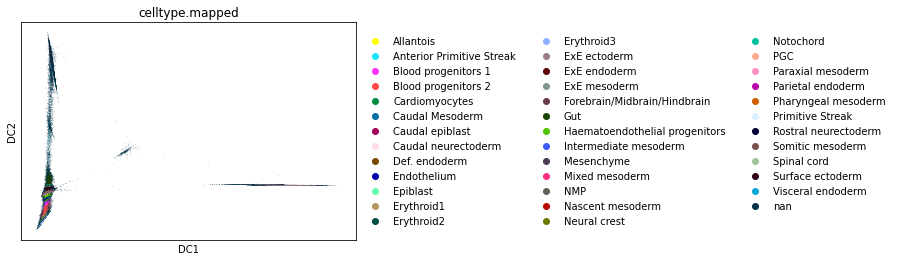

In [34]:
sc.pp.neighbors(adata_wt, n_pcs=50, n_neighbors=20) #or chim

sc.tl.umap(adata_wt)

sc.pl.umap(adata_wt, color = 'celltype.mapped', na_color='lightgray')

sc.tl.diffmap(adata_wt)
sc.pp.neighbors(adata_wt, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_wt, color=['celltype.mapped'] )#, legend_loc='on data')

In [39]:
import matplotlib.pyplot as plt

In [56]:
np.unique(adata_wt.obs['tdTom'])


array(['nan', 'neg', 'pos'], dtype=object)

In [8]:
celltypes = ['Allantois', 'Anterior Primitive Streak', 'Blood progenitors 1',
       'Blood progenitors 2', 'Cardiomyocytes', 'Caudal Mesoderm',
       'Caudal epiblast', 'Caudal neurectoderm', 'Def. endoderm',
       'Endothelium', 'Epiblast', 'Erythroid1', 'Erythroid2',
       'Erythroid3', 'ExE ectoderm', 'ExE endoderm', 'ExE mesoderm',
       'Forebrain/Midbrain/Hindbrain', 'Gut',
       'Haematoendothelial progenitors', 'Intermediate mesoderm',
       'Mesenchyme', 'Mixed mesoderm', 'NMP', 'Nascent mesoderm',
       'Neural crest', 'Notochord', 'PGC', 'Paraxial mesoderm',
       'Parietal endoderm', 'Pharyngeal mesoderm', 'Primitive Streak',
       'Rostral neurectoderm', 'Somitic mesoderm', 'Spinal cord',
       'Surface ectoderm', 'Visceral endoderm']

In [9]:
stages = ['E6.5', 'E6.75', 'E7.0', 'E7.25', 'E7.5', 'E7.75', 'E8.0', 'E8.25',
       'E8.5', 'mixed_gastrulation']

In [10]:
tdTom = ['neg', 'pos']

In [28]:
lista_colori = ['#532C8A',
 '#c19f70',
 '#f9decf',
 '#c9a997',
 '#B51D8D',
 '#3F84AA',
 '#9e6762',
 '#354E23',
 '#F397C0',
 '#eda450',
 '#635547',
 '#C72228',
 '#EF4E22',
 '#f77b59',
 '#989898',
 '#7F6874',
 '#8870ad',
 '#647a4f',
 '#EF5A9D',
 '#FBBE92',
 '#139992',
 '#ed8f84',
 '#DFCDE4',
 '#8EC792',
 '#C594BF',
 '#C3C388',
 '#0F4A9C',
 '#FACB12',
 '#8DB5CE',
 '#1A1A1A',
 '#C9EBFB',
 '#DABE99',
 '#65A83E',
 '#005579',
 '#CDE088',
 '#BBDCA8',
 '#F6BFCB'
               ,
'#F5F5F5']

adata_wt.uns['celltype.mapped_colors'] = lista_colori

In [13]:
np.unique(adata_wt.obs['stage.mapped'])

array(['E6.5', 'E6.75', 'E7.0', 'E7.25', 'E7.5', 'E7.75', 'E8.0', 'E8.25',
       'E8.5', 'mixed_gastrulation', 'nan'], dtype=object)

<ipython-input-38-4b70575c6b75>:2: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap.set_under('lightgray')
<ipython-input-38-4b70575c6b75>:3: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap.set_bad('lightgray')


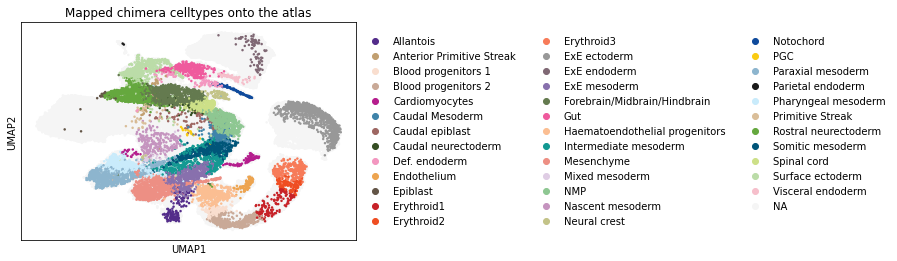

In [38]:
cmap = plt.get_cmap('viridis')
cmap.set_under('lightgray')
cmap.set_bad('lightgray')

adata_wt.obs['celltype.mapped'] = adata_wt.obs['celltype.mapped'].astype(str).astype('category')
sc.pl.umap(adata_wt, color = 'celltype.mapped', groups=celltypes, na_color='whitesmoke', title = "Mapped chimera celltypes onto the atlas", size=25, save='Mapped celltypes of chimera cells')

In [27]:
stage_colours = ['#D53E4F',
 '#F46D43',
 '#FDAE61',
 '#FEE08B',
 '#FFFFBF',
 '#E6F598',
 '#ABDDA4',
 '#66C2A5',
 '#3288BD',
 '#A9A9A9',
'#F5F5F5']
adata_wt.uns['stage.mapped_colors'] = stage_colours

In [16]:
adata_wt.obs['stage.mapped']

atlas_cell_1-0       nan
atlas_cell_2-0       nan
atlas_cell_5-0       nan
atlas_cell_6-0       nan
atlas_cell_8-0       nan
                   ...  
wt_cell_13477-1    E7.75
wt_cell_13478-1     E8.5
wt_cell_13479-1     E8.5
wt_cell_13480-1     E8.5
wt_cell_13481-1     E8.5
Name: stage.mapped, Length: 129793, dtype: category
Categories (11, object): ['E6.5', 'E6.75', 'E7.0', 'E7.5', ..., 'E8.5', 'E8.25', 'mixed_gastrulation', 'nan']

<ipython-input-37-c6c7f9cc4904>:2: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap.set_under('lightgray')
<ipython-input-37-c6c7f9cc4904>:3: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap.set_bad('lightgray')


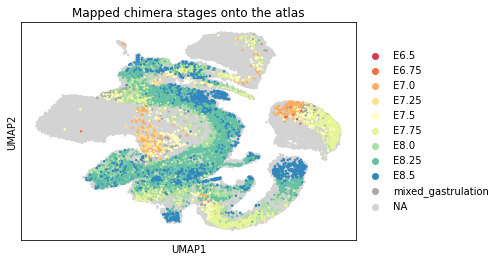

In [37]:
cmap = plt.get_cmap('viridis')
cmap.set_under('lightgray')
cmap.set_bad('lightgray')

adata_wt.obs['stage.mapped'] = adata_wt.obs['stage.mapped'].astype(str).astype('category')
sc.pl.umap(adata_wt, color = 'stage.mapped', groups=stages, na_color='lightgray', title = "Mapped chimera stages onto the atlas", size=25, save='Mapped cellstages of chimera cells')

In [46]:
len(np.unique(adata_wt.obs['celltype.mapped']))

37

In [40]:
np.unique(adata_wt.obs['tdTom'])

array(['nan', 'neg', 'pos'], dtype=object)

In [41]:
tdTom_colours = ['#F5F5F5',
                 '#000000'
                 '#FF0000',
                 ]
adata_wt.uns['tdTom_colors'] = tdTom_colours

<ipython-input-42-fa8033667952>:2: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap.set_under('lightgray')
<ipython-input-42-fa8033667952>:3: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap.set_bad('lightgray')


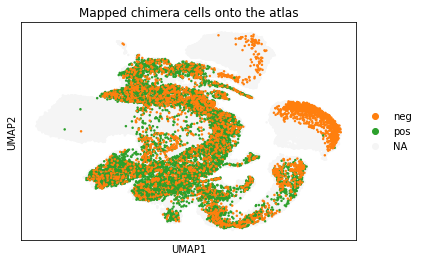

In [42]:
cmap = plt.get_cmap('viridis')
cmap.set_under('lightgray')
cmap.set_bad('lightgray')

adata_wt.obs['tdTom'] = adata_wt.obs['tdTom'].astype(str).astype('category')
sc.pl.umap(adata_wt, color = 'tdTom', groups=tdTom, na_color='whitesmoke', title = "Mapped chimera cells onto the atlas", size=25, save='Mapped tdTom of chimera cells')

In [44]:
adata_wtwt = adata_wt[adata_wt.obs['tdTom']=='neg',:].copy()

In [43]:
adata_wtwt

AnnData object with n_obs × n_vars = 7878 × 27151
    obs: 'barcode', 'batch', 'celltype', 'celltype.mapped', 'closest.cell', 'cluster', 'cluster.stage', 'cluster.sub', 'cluster.theiler', 'colour', 'doub.density', 'doublet', 'endo_gephiX', 'endo_gephiY', 'endo_gutCluster', 'endo_gutDPT', 'endo_gutX', 'endo_gutY', 'endo_trajectoryDPT', 'endo_trajectoryName', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'sample', 'sequencing.batch', 'sizeFactor', 'stage', 'stage.mapped', 'stripped', 'tdTom', 'theiler', 'umapX', 'umapY', 'gut_subclust.mapped', 'haem_subclust.mapped', 'meso.mapped'
    uns: 'celltype.mapped_colors', 'stage.mapped_colors', 'tdTom_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'logcounts'

<ipython-input-46-98ab5c42ff11>:2: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap.set_under('lightgray')
<ipython-input-46-98ab5c42ff11>:3: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap.set_bad('lightgray')


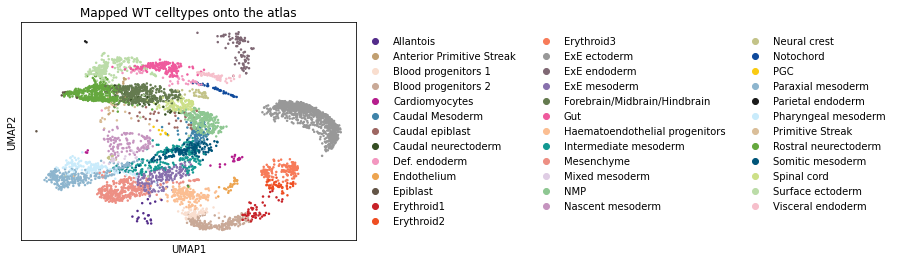

In [46]:
cmap = plt.get_cmap('viridis')
cmap.set_under('lightgray')
cmap.set_bad('lightgray')

adata_wtwt.obs['celltype.mapped'] = adata_wtwt.obs['celltype.mapped'].astype(str).astype('category')
sc.pl.umap(adata_wtwt, color = 'celltype.mapped', groups=celltypes, na_color='lightgray', title = "Mapped WT host celltypes onto the atlas", size=25, save='Mapped WT host of chimera cells')

In [57]:
adata_wtchim = adata_wt[adata_wt.obs['tdTom']=='pos',:].copy()

NameError: name 'adata_wt' is not defined

<ipython-input-48-fef44e07af3c>:2: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap.set_under('lightgray')
<ipython-input-48-fef44e07af3c>:3: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap.set_bad('lightgray')


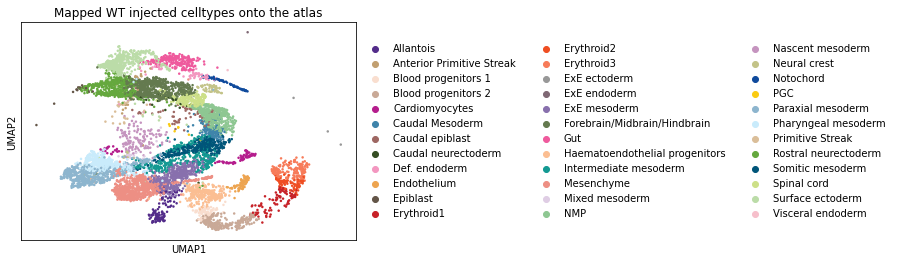

In [48]:
cmap = plt.get_cmap('viridis')
cmap.set_under('lightgray')
cmap.set_bad('lightgray')

adata_wtchim.obs['celltype.mapped'] = adata_wtchim.obs['celltype.mapped'].astype(str).astype('category')
sc.pl.umap(adata_wtchim, color = 'celltype.mapped', groups=celltypes, na_color='lightgray', title = "Mapped WT injected celltypes onto the atlas", size=25, save='Mapped WT injected chimera cells')

In [66]:
adata_wtchim

AnnData object with n_obs × n_vars = 7878 × 27151
    obs: 'barcode', 'batch', 'cell', 'celltype', 'celltype.mapped', 'closest.cell', 'cluster', 'cluster.stage', 'cluster.sub', 'cluster.theiler', 'colour', 'doub.density', 'doublet', 'endo_gephiX', 'endo_gephiY', 'endo_gutCluster', 'endo_gutDPT', 'endo_gutX', 'endo_gutY', 'endo_trajectoryDPT', 'endo_trajectoryName', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'sample', 'sequencing.batch', 'sizeFactor', 'stage', 'stage.mapped', 'stripped', 'tdTom', 'theiler', 'umapX', 'umapY'
    uns: 'neighbors', 'umap', 'celltype.mapped_colors', 'diffmap_evals', 'stage_colors', 'stage.mapped_colors', 'tdTom_colors'
    obsm: 'X_pca', 'X_umap', 'X_diffmap'
    layers: 'logcounts'
    obsp: 'distances', 'connectivities'

In [56]:
sc.pp.neighbors(adata_wtchim, n_pcs=30, n_neighbors=20) #or chim

sc.tl.umap(adata_wtchim)

sc.pl.umap(adata_wtchim, color = 'celltype.mapped', na_color='lightgray')

sc.tl.diffmap(adata_wtchim)

sc.pp.neighbors(adata_wtchim, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_wtchim, color=['celltype.mapped'] )#, legend_loc='on data')

adata_wtchim.uns['iroot'] = np.flatnonzero(adata_wtchim.obs['celltype.mapped']=='Paraxial mesoderm')[0]

sc.tl.dpt(adata_wtchim)

sc.pl.umap(adata_wtchim, color='dpt_pseudotime', title='Diffusion pseudotime for the refined mesodermal subpopulations')#, save='Diffusion pseudotime for the refined mesodermal subpopulations') 

NameError: name 'adata_wtchim' is not defined

In [136]:
adata_wt.obs

,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,cluster.theiler,...,sample,sequencing.batch,sizeFactor,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY
atlas_cell_1-0,AAAGGCCTCCACAA,0,atlas_cell_1,Epiblast,nan,nan,2.0,2.0,4.0,3.0,...,1,1,NaN,E6.5,nan,0,nan,TS9,-10.227546,-2.881687
atlas_cell_2-0,AACAAACTCGCCTT,0,atlas_cell_2,Primitive Streak,nan,nan,12.0,1.0,1.0,1.0,...,1,1,NaN,E6.5,nan,0,nan,TS9,-6.625458,0.108961
atlas_cell_5-0,AACAGAGAATCAGC,0,atlas_cell_5,ExE ectoderm,nan,nan,3.0,4.0,7.0,6.0,...,1,1,NaN,E6.5,nan,0,nan,TS9,10.061009,-0.029313
atlas_cell_6-0,AACATATGAATCGC,0,atlas_cell_6,Epiblast,nan,nan,1.0,3.0,1.0,7.0,...,1,1,NaN,E6.5,nan,0,nan,TS9,-10.454418,-0.269452
atlas_cell_8-0,AACCGATGGCTTCC,0,atlas_cell_8,Epiblast,nan,nan,2.0,2.0,1.0,3.0,...,1,1,NaN,E6.5,nan,0,nan,TS9,-11.047206,-2.205269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
wt_cell_13477-1,TTTGGTTGTGATGCCC,1,nan,Rostral neurectoderm,Rostral neurectoderm,atlas_cell_8750,NaN,NaN,NaN,NaN,...,mixl_6,0,0.422911,E8.5,E7.75,0,neg,nan,NaN,NaN
wt_cell_13478-1,TTTGGTTTCGCTTAGA,1,nan,Erythroid3,Erythroid3,atlas_cell_97649,NaN,NaN,NaN,NaN,...,mixl_6,0,1.336606,E8.5,E8.5,0,neg,nan,NaN,NaN
wt_cell_13479-1,TTTGTCAAGACAATAC,1,nan,Erythroid3,Erythroid3,atlas_cell_38655,NaN,NaN,NaN,NaN,...,mixl_6,0,2.407617,E8.5,E8.5,0,neg,nan,NaN,NaN
wt_cell_13480-1,TTTGTCAAGGTAGCTG,1,nan,Erythroid2,Erythroid2,atlas_cell_133630,NaN,NaN,NaN,NaN,...,mixl_6,0,2.770574,E8.5,E8.5,0,neg,nan,NaN,NaN


In [146]:
adata_meso.obs.shape

(235, 42)

In [141]:
meso = ['Anterior-most_somites', 'Dermomyotome', 'Head_mesoderm',
       'Posterior-most_somites', 'Presomitic_mesoderm', 'Sclerotome']

adata_meso = adata_wt[adata_wt.obs['meso.mapped'].isin(meso),:].copy()

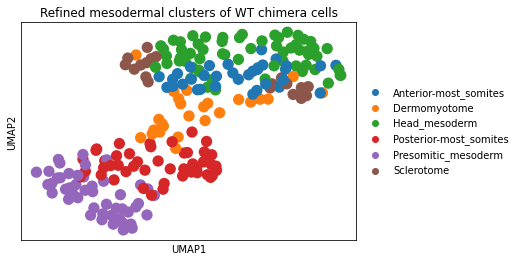

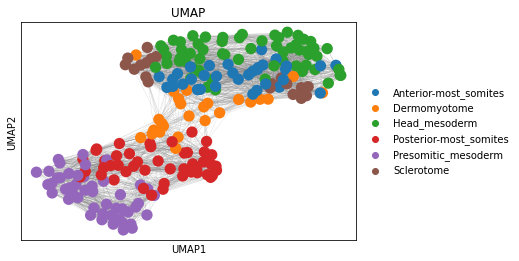

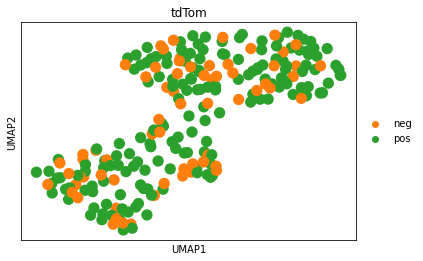

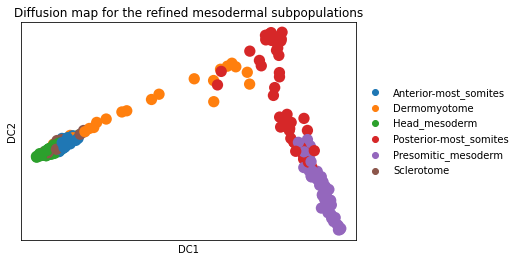

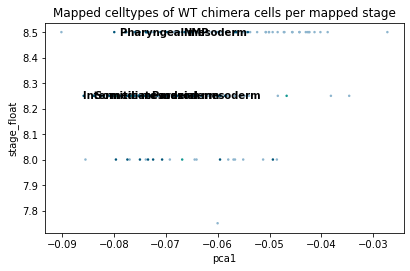

In [150]:

sc.pp.neighbors(adata_meso, n_neighbors = 30)

sc.tl.umap(adata_meso)

sc.pl.umap(adata_meso, color='meso.mapped', title='Refined mesodermal clusters of WT chimera cells', save='Umap of meso WT chimera cells')

sc.pl.umap(adata_meso, color='meso.mapped', title="UMAP", edges=True)


sc.pl.umap(adata_meso, color='tdTom', save='tdTom of meso WT chimera cells')

sc.tl.diffmap(adata_meso)

sc.pp.neighbors(adata_meso, n_neighbors=10, use_rep='X_diffmap')

sc.pl.diffmap(adata_meso, color=['meso.mapped'], title='Diffusion map for the refined mesodermal subpopulations', save='Diffmap of meso WT chimera cells' )#, legend_loc='on data')

np.unique(adata_meso.obs['celltype.mapped'])

vec = [0] * 235

for i in range(235):
    if adata_meso.obs['stage.mapped'][i].startswith('E'):
        vec[i] = float(str.split(adata_meso.obs['stage.mapped'][i],'E')[1])
    else :
        vec[i] = 10


adata_meso.obs['stage_float'] = vec

adata_meso.obs['pca1'] = adata_meso.obsm['X_pca'][:,0]

adata_meso.obs['umap'] = adata_meso.obsm['X_pca'][:,0]
 
sc.pl.scatter(adata_meso, x='pca1', y='stage_float', color = 'celltype.mapped',size=25, legend_loc='on data', save='Mapped celltypes of WT chimera cells according to meso stage', title='Mapped celltypes of WT chimera cells per mapped stage' )




In [148]:
np.unique(adata_meso.obs['celltype.mapped'])

array(['Intermediate mesoderm', 'NMP', 'Paraxial mesoderm',
       'Pharyngeal mesoderm', 'Somitic mesoderm'], dtype=object)

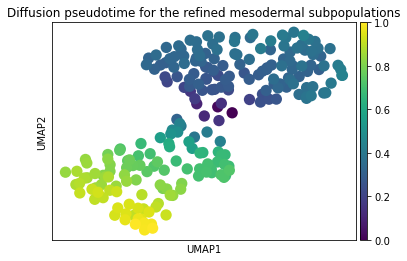

In [151]:
adata_meso.uns['iroot'] = np.flatnonzero(adata_meso.obs['celltype.mapped']=='Paraxial mesoderm')[0]

sc.tl.dpt(adata_meso)

sc.pl.umap(adata_meso, color='dpt_pseudotime', title='Diffusion pseudotime for the refined mesodermal subpopulations', save='Diffusion pseudotime for the refined mesodermal subpopulations') 

In [21]:
adata_wt.obs['sample']

wt_cell_1-1        mixl_1
wt_cell_2-1        mixl_1
wt_cell_3-1        mixl_1
wt_cell_4-1        mixl_1
wt_cell_5-1        mixl_1
                    ...  
wt_cell_13477-1    mixl_6
wt_cell_13478-1    mixl_6
wt_cell_13479-1    mixl_6
wt_cell_13480-1    mixl_6
wt_cell_13481-1    mixl_6
Name: sample, Length: 13481, dtype: category
Categories (6, object): ['mixl_1', 'mixl_2', 'mixl_3', 'mixl_4', 'mixl_5', 'mixl_6']

In [ ]:
#temporally expressed genes

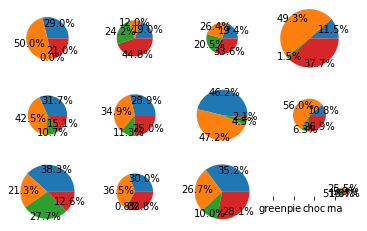

[[1.2510660141e+01 2.1609734803e+01 3.4312445203e-03 9.0699771790e+00]
 [4.4026767245e+00 2.7701578431e+00 5.5878063413e+00 1.0366821811e+01]
 [1.1903024227e+01 1.6164502020e+01 1.2575835432e+01 2.0556585012e+01]
 [6.1335674919e+00 2.6343523092e+01 8.2162779594e-01 2.0114025305e+01]
 [1.2519144071e+01 1.6760694853e+01 4.2116081579e+00 5.9430446725e+00]
 [2.4022337060e+01 2.9047847272e+01 9.4027253448e+00 2.0769678470e+01]
 [2.6291674569e+01 2.6838199905e+01 2.5513263411e+00 1.1716434970e+00]
 [5.0949125869e+00 2.6344275103e+01 2.9504050150e+00 1.2633228750e+01]
 [2.8736685905e+01 1.5994958549e+01 2.0756313419e+01 9.4654689302e+00]
 [2.0595027830e+01 2.5038770157e+01 5.4864832033e-01 2.2504329448e+01]
 [2.9665832667e+01 2.2444969631e+01 8.4133197619e+00 2.3678379854e+01]
 [3.0967801973e+00 1.3436805785e+01 2.7257865093e+01 8.8084244512e+00]]


In [92]:
import matplotlib.pyplot as plt
np.random.seed(1)
t = "Plot a pie chart  with different sized pies all in one figure"
X  = np.random.rand(12,4)*30
r = np.random.rand(12)*0.8+0.6 #change this to fraction of WT to KO
fig, axes= plt.subplots(3, 4) #number of celltypes by number of mapped stages

for i, ax in enumerate(axes.flatten()):
    x = X[i,:]/np.sum(X[i,:])
    ax.pie(x, radius = r[i], autopct="%.1f%%", pctdistance=0.9)
#     ax.set_title(t.split()[i])
    
plt.xticks(range(-20,4,6), ["green", "pie", "choc", "rna"])
plt.show()
print(X)

In [88]:
axes

array([[<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]],
      dtype=object)

In [142]:
adata_chim

AnnData object with n_obs × n_vars = 37208 × 31217
    obs: 'sample', 'stage', 'barcode', 'sequencing.batch', 'stripped', 'doublet', 'theiler', 'doub.density', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'weight', 'stage.mapped', 'celltype.mapped', 'closest.cell', 'sizeFactor', 'tdTom', 'comb', 'cell', 'meso.mapped'
    uns: 'celltype.mapped_colors', 'neighbors', 'umap', 'diffmap_evals', 'tdTom_colors'
    obsm: 'X_pca', 'X_umap', 'X_diffmap'
    layers: 'logcounts'
    obsp: 'distances', 'connectivities'

In [141]:
np.unique(adata.obs['cluster'])

array([ 1.,  2.,  3., ..., nan, nan, nan])

In [241]:
adata_chim

AnnData object with n_obs × n_vars = 37208 × 31217
    obs: 'sample', 'stage', 'barcode', 'sequencing.batch', 'stripped', 'doublet', 'theiler', 'doub.density', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'weight', 'stage.mapped', 'celltype.mapped', 'closest.cell', 'sizeFactor', 'tdTom'
    obsm: 'X_pca'
    layers: 'logcounts'

## PAGA

In [298]:
pd.DataFrame(adata_chim.obsm['X_umap']).to_csv("C:/Users/aamw4/home/aamw4/umap_coordinates")

In [ ]:
import numpy as np
import scanpy as sc
import pandas as pd
import anndata as ad
import matplotlib.pyplot as plt

In [ ]:
#adata = sc.read('C:/Users/aamw4/home/aamw4/mixl_chim_atlas.h5')
adata = sc.read('/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/data/mixl_chim_atlas.h5')

adata_chim = adata[adata.obs_names.str.startswith('chim'),:].copy()

adata_atlas = adata[adata.obs_names.str.startswith('atlas'),:].copy()

In [168]:
#df = pd.read_csv('C:/Users/aamw4/home/aamw4/ensembl_gene_table_81.txt', header=0, sep='\t', index_col=0)
df = pd.read_csv('/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/data/ensembl_gene_table_81.txt', header=0, sep='\t', index_col=0)
df

list_names = [name for name in list(df.index) if name in adata_chim.var_names]

adata_chim =  adata_chim[:,list_names].copy()

adata_chim.var_names = list(df.loc[list_names]['Associated Gene Name'])

adata_chim.var_names_make_unique()

adata_chim.var_names

Index(['mt-Cytb', 'mt-Nd6', 'mt-Nd5', 'mt-Nd4', 'mt-Nd4l', 'mt-Nd3', 'mt-Co3',
       'mt-Atp6', 'mt-Atp8', 'mt-Co2',
       ...
       'Impact', 'Dsg3', 'Fam13b', 'Rprd1a', 'Taf4b', 'Zfp521', 'Hrh4', 'Dsc1',
       'Psma8', '2700062C07Rik'],
      dtype='object', length=27917)

In [251]:
adata_chim.uns

OverloadedDict, wrapping:
	OrderedDict([('neighbors', {'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'n_neighbors': 15, 'method': 'umap', 'random_state': 0, 'metric': 'euclidean', 'use_rep': 'X_diffmap'}}), ('umap', {'params': {'a': 0.5830300198678042, 'b': 1.3341669929396847}}), ('diffmap_evals', array([1.        , 0.99995464, 0.9988562 , 0.9975449 , 0.99666095,
       0.9963081 , 0.99600524, 0.9954814 , 0.9952261 , 0.9940387 ,
       0.99147433, 0.9909327 , 0.9903343 , 0.99023837, 0.9879812 ],
      dtype=float32)), ('paga', {'connectivities': <34x34 sparse matrix of type '<class 'numpy.float64'>'
	with 230 stored elements in Compressed Sparse Row format>, 'connectivities_tree': <34x34 sparse matrix of type '<class 'numpy.float64'>'
	with 33 stored elements in Compressed Sparse Row format>, 'groups': 'celltype.mapped', 'pos': array([[14.399118 , 14.586536 ],
       [-3.156601 ,  6.4317026],
       [10.812127 , 15.198218 ],
       [ 6.505756 , -4.379

In [249]:
df = pd.DataFrame(adata_chim.uns['paga']['connectivities'].todense())

In [252]:
coordinates = [[14.399118 , 14.586536 ],
       [-3.156601 ,  6.4317026],
       [10.812127 , 15.198218 ],
       [ 6.505756 , -4.3791046],
       [10.683537 ,  3.1874866],
       [-1.5727428,  4.9466887],
       [16.768272 ,  2.5640597],
       [ 8.3322935, 11.096814 ],
       [ 9.286304 , 19.935846 ],
       [20.581388 ,  3.1010513],
       [12.340531 ,  8.537607 ],
       [ 2.5729978, -2.636153 ],
       [ 0.6306744,  5.993721 ],
       [ 9.547219 , -1.0530756],
       [11.826102 , 10.638827 ],
       [10.500959 , 10.578917 ],
       [11.854865 ,  5.595479 ],
       [ 4.025902 ,  5.7205224],
       [23.535467 ,  7.1391873],
       [ 3.2564747, 14.6656685],
       [ 5.034457 ,  3.8340468],
       [19.770336 ,  5.758606 ],
       [20.625076 , 10.174624 ],
       [ 7.3944535, 13.993313 ],
       [19.251139 ,  6.6987343],
       [ 8.666344 , -0.4919728],
       [22.074833 ,  3.705512 ],
       [ 5.477947 ,  3.249282 ],
       [ 5.852097 , -4.7062864],
       [ 6.916519 , 11.7368355],
       [ 9.351078 , 12.934916 ],
       [10.800565 ,  2.6688778],
       [19.57089  ,  5.566085 ],
       [22.049244 ,  5.5485945]]

In [265]:
np.unique(adata_chim.obs['celltype.mapped'])

array(['Allantois', 'Anterior Primitive Streak', 'Blood progenitors 1',
       'Blood progenitors 2', 'Cardiomyocytes', 'Caudal Mesoderm',
       'Caudal epiblast', 'Caudal neurectoderm', 'Def. endoderm',
       'Endothelium', 'Erythroid1', 'Erythroid2', 'Erythroid3',
       'ExE ectoderm', 'ExE endoderm', 'ExE mesoderm',
       'Forebrain/Midbrain/Hindbrain', 'Gut',
       'Haematoendothelial progenitors', 'Intermediate mesoderm',
       'Mesenchyme', 'Mixed mesoderm', 'NMP', 'Neural crest', 'Notochord',
       'PGC', 'Paraxial mesoderm', 'Parietal endoderm',
       'Pharyngeal mesoderm', 'Rostral neurectoderm', 'Somitic mesoderm',
       'Spinal cord', 'Surface ectoderm', 'Visceral endoderm'],
      dtype=object)

In [262]:
adata_chim.uns

OverloadedDict, wrapping:
	OrderedDict([('neighbors', {'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'n_neighbors': 15, 'method': 'umap', 'random_state': 0, 'metric': 'euclidean', 'use_rep': 'X_diffmap'}}), ('umap', {'params': {'a': 0.5830300198678042, 'b': 1.3341669929396847}}), ('diffmap_evals', array([1.        , 0.99995464, 0.9988562 , 0.9975449 , 0.99666095,
       0.9963081 , 0.99600524, 0.9954814 , 0.9952261 , 0.9940387 ,
       0.99147433, 0.9909327 , 0.9903343 , 0.99023837, 0.9879812 ],
      dtype=float32)), ('paga', {'connectivities': <34x34 sparse matrix of type '<class 'numpy.float64'>'
	with 230 stored elements in Compressed Sparse Row format>, 'connectivities_tree': <34x34 sparse matrix of type '<class 'numpy.float64'>'
	with 33 stored elements in Compressed Sparse Row format>, 'groups': 'celltype.mapped', 'pos': array([[14.399118 , 14.586536 ],
       [-3.156601 ,  6.4317026],
       [10.812127 , 15.198218 ],
       [ 6.505756 , -4.379

In [257]:
x = [coordinates[i][0] for i in range(33)]
y = [coordinates[i][1] for i in range(33)]

In [272]:
adata_chim.obsm

AxisArrays with keys: X_pca, X_umap, X_diffmap

In [267]:
print(len(coordinates))

34


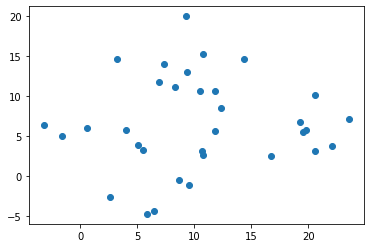

In [258]:
plt.scatter(x, y)

In [242]:
sc.pp.neighbors(adata_chim, n_neighbors=30)

In [243]:
sc.tl.umap(adata_chim)

In [244]:
sc.pp.neighbors(adata_chim, n_neighbors = 20, method='umap')

In [245]:
sc.tl.diffmap(adata_chim)

In [246]:
sc.pp.neighbors(adata_chim, n_neighbors=15, use_rep='X_diffmap')

In [274]:
sc.tl.paga(adata_chim, groups='celltype.mapped')

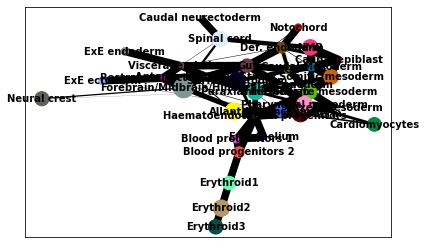

In [270]:
sc.pl.paga(adata_chim, color='celltype.mapped',) #save='PAGA Mixl1 chimera cells')

In [173]:
sc.tl.draw_graph(adata_chim, init_pos='paga')

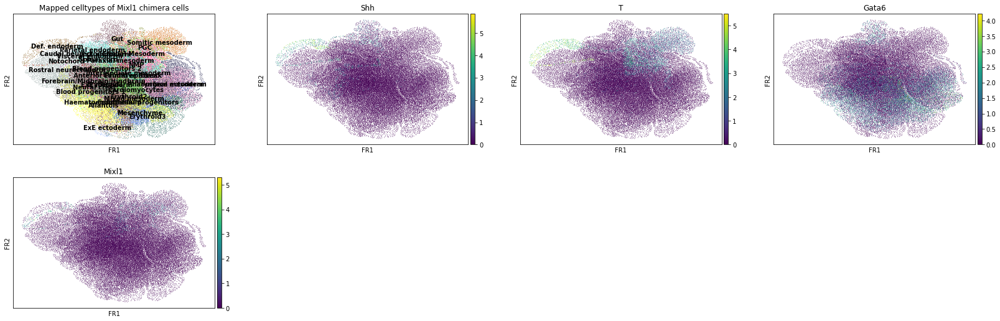

In [161]:
sc.pl.draw_graph(adata_chim, color=['celltype.mapped', 'Shh', 'T', 'Gata6', 'Mixl1'], title='Mapped celltypes of Mixl1 chimera cells', legend_loc='on data', save='celltype mapped Mixl1 chimera cells PAGA')

In [292]:
sc.pl.paga_compare(adata_chim, basis ='umap', pos=pos, color='celltype.mapped', fontsize=4,
                   edge_width_scale=0.1, title='comparison between UMAP and PAGA', save='comparison between UMAP and PAGA Mixl1 chimera cells NEWs') #, legend_loc='right margin',)

NameError: name 'pos' is not defined

In [294]:
adata_mixwt = adata_chim[adata_chim.obs['tdTom']=='neg',:].copy()
adata_mixl = adata_chim[adata_chim.obs['tdTom']=='pos',:].copy()

In [ ]:
sc.pp.neighbors(adata_mixl, n_neighbors=30)

sc.tl.umap(adata_mixl)

sc.pp.neighbors(adata_mixl, n_neighbors = 20, method='umap')

sc.tl.diffmap(adata_mixl)

sc.pp.neighbors(adata_mixl, n_neighbors=15, use_rep='X_diffmap')

sc.tl.paga(adata_mixl, groups='celltype.mapped')

In [ ]:
sc.pl.paga_compare(adata_mixl, basis ='umap', pos=pos, color='celltype.mapped', fontsize=4,
                   edge_width_scale=0.1, title='comparison between UMAP and PAGA', save='comparison between UMAP and PAGA Mixl1-null cells') #, legend_loc='right margin',)

In [ ]:
sc.pp.neighbors(adata_mixwt, n_neighbors=30)

sc.tl.umap(adata_mixwt)

sc.pp.neighbors(adata_mixwt, n_neighbors = 20, method='umap')

sc.tl.diffmap(adata_mixwt)

sc.pp.neighbors(adata_mixwt, n_neighbors=15, use_rep='X_diffmap')

sc.tl.paga(adata_mixwt, groups='celltype.mapped')

In [ ]:
sc.pl.paga_compare(adata_mixwt, basis ='umap', pos=pos, color='celltype.mapped', fontsize=4,
                   edge_width_scale=0.1, title='comparison between UMAP and PAGA', save='comparison between UMAP and PAGA Mixl1-WT cells') #, legend_loc='right margin',)

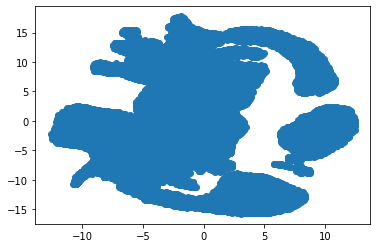

In [278]:
plt.scatter(adata_atlas.obs['umapX'], adata_atlas.obs['umapY'])

In [285]:
adata_atlas.obsm['X_umap'] = np.array( [list(adata_atlas.obs['umapX']),list(adata_atlas.obs['umapY'])]).T                  

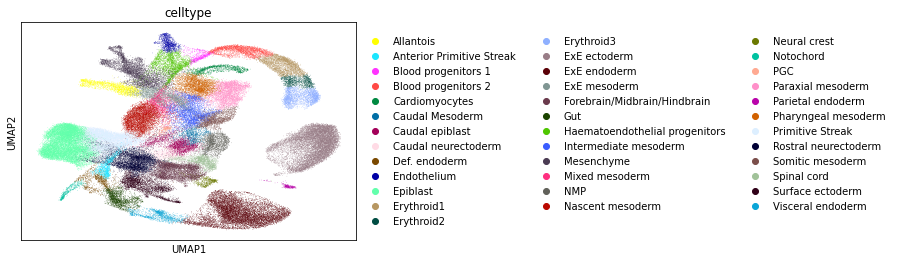

In [286]:
sc.pl.umap(adata_atlas, color='celltype')

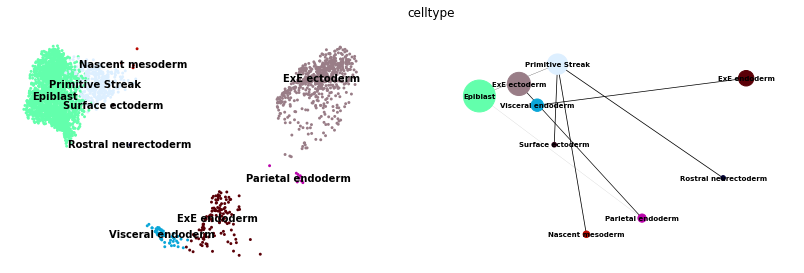

In [287]:
  
adata_sub = adata_atlas[adata_atlas.obs.stage == 'E6.5',:].copy()


sc.pp.neighbors(adata_sub, n_neighbors=20, method='umap')


sc.tl.diffmap(adata_sub)


sc.pp.neighbors(adata_sub, n_neighbors=15, use_rep='X_diffmap')
sc.tl.paga(adata_sub, groups='celltype')


sc.pl.paga_compare(adata_sub, basis = 'umap', color='celltype', fontsize=7,
                   edge_width_scale=0.1)








In [317]:
adata_chim.var

""
mt-Cytb
mt-Nd6
mt-Nd5
mt-Nd4
mt-Nd4l
...
Zfp521
Hrh4
Dsc1
Psma8


KeyError: 'Could not find key dpt_pseudotime in .var_names or .obs.columns.'

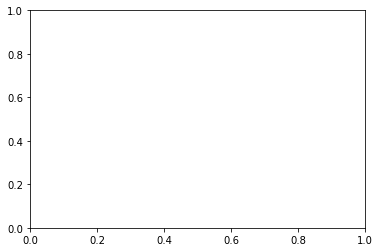

In [319]:
sc.pl.umap(adata_chim, color='dpt_pseudotime')#, gene_symbols='Sox17')